In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cufflinks as cf
import yfinance as yf

# 1. Technical Indicators

In [2]:
# Load financial data from Yahoo Finance API
start = "2010-01-01"
end = "2020-12-31"
symbol = "MSFT"

data = yf.download(tickers=symbol, start=start, end=end)
data

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,30.620001,31.100000,30.590000,30.950001,23.347313,38409100
2010-01-05,30.850000,31.100000,30.639999,30.959999,23.354860,49749600
2010-01-06,30.879999,31.080000,30.520000,30.770000,23.211536,58182400
2010-01-07,30.629999,30.700001,30.190001,30.450001,22.970144,50559700
2010-01-08,30.280001,30.879999,30.240000,30.660000,23.128553,51197400
...,...,...,...,...,...,...
2020-12-23,223.110001,223.559998,220.800003,221.020004,214.069580,18699600
2020-12-24,221.419998,223.610001,221.199997,222.750000,215.745132,10550600
2020-12-28,224.449997,226.029999,223.020004,224.960007,217.885681,17933500


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2768 entries, 2010-01-04 to 2020-12-30
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       2768 non-null   float64
 1   High       2768 non-null   float64
 2   Low        2768 non-null   float64
 3   Close      2768 non-null   float64
 4   Adj Close  2768 non-null   float64
 5   Volume     2768 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 151.4 KB


In [4]:
symbols = ["MSFT", "GE", "AAPL"]

data = yf.download(tickers=symbols, start=start, end=end)
data

[*********************100%***********************]  3 of 3 completed


Price                       Adj Close                              Close  \
Ticker                           AAPL         GE        MSFT        AAPL   
Date                                                                       
2010-01-04 00:00:00+00:00    6.447411  53.996006   23.347313    7.643214   
2010-01-05 00:00:00+00:00    6.458559  54.275612   23.354860    7.656429   
2010-01-06 00:00:00+00:00    6.355827  53.996006   23.211536    7.534643   
2010-01-07 00:00:00+00:00    6.344077  56.791939   22.970144    7.520714   
2010-01-08 00:00:00+00:00    6.386254  58.015148   23.128553    7.570714   
...                               ...        ...         ...         ...   
2020-12-23 00:00:00+00:00  128.059906  53.300049  214.069580  130.960007   
2020-12-24 00:00:00+00:00  129.047531  52.269379  215.745132  131.970001   
2020-12-28 00:00:00+00:00  133.662994  52.220306  217.885681  136.690002   
2020-12-29 00:00:00+00:00  131.883331  51.827679  217.101151  134.869995   
2020-12-30 00:00:00+00:00  130.758789  52.563858  214.708817  133.720001   

Price                                                   High             \
Ticker                            GE        MSFT        AAPL         GE   
Date                                                                      
2010-01-04 00:00:00+00:00  74.043159   30.950001    7.660714  74.953720   
2010-01-05 00:00:00+00:00  74.426552   30.959999    7.699643  75.097496   
2010-01-06 00:00:00+00:00  74.043159   30.770000    7.686786  74.857872   
2010-01-07 00:00:00+00:00  77.877106   30.450001    7.571429  78.979370   
2010-01-08 00:00:00+00:00  79.554459   30.660000    7.571429  79.985779   
...                              ...         ...         ...        ...   
2020-12-23 00:00:00+00:00  54.127705  221.020004  132.429993  54.725800   
2020-12-24 00:00:00+00:00  53.081036  222.750000  133.460007  54.077862   
2020-12-28 00:00:00+00:00  53.031197  224.960007  137.339996  53.728973   
2020-12-29 00:00:00+00:00  52.632465  224.149994  138.789993  53.679134   
2020-12-30 00:00:00+00:00  53.380085  221.679993  135.990005  54.077862   

Price                                         Low                         \
Ticker                           MSFT        AAPL         GE        MSFT   
Date                                                                       
2010-01-04 00:00:00+00:00   31.100000    7.585000  72.605423   30.590000   
2010-01-05 00:00:00+00:00   31.100000    7.616071  74.043159   30.639999   
2010-01-06 00:00:00+00:00   31.080000    7.526786  73.995232   30.520000   
2010-01-07 00:00:00+00:00   30.700001    7.466071  73.947311   30.190001   
2010-01-08 00:00:00+00:00   30.879999    7.466429  77.972954   30.240000   
...                               ...         ...        ...         ...   
2020-12-23 00:00:00+00:00  223.559998  130.779999  52.931511  220.800003   
2020-12-24 00:00:00+00:00  223.610001  131.100006  52.931511  221.199997   
2020-12-28 00:00:00+00:00  226.029999  133.509995  52.732147  223.020004   
2020-12-29 00:00:00+00:00  227.179993  134.339996  52.532784  223.580002   
2020-12-30 00:00:00+00:00  225.630005  133.399994  52.582623  221.470001   

Price                            Open                            Volume  \
Ticker                           AAPL         GE        MSFT       AAPL   
Date                                                                      
2010-01-04 00:00:00+00:00    7.622500  72.940895   30.620001  493729600   
2010-01-05 00:00:00+00:00    7.664286  74.091080   30.850000  601904800   
2010-01-06 00:00:00+00:00    7.656429  74.426552   30.879999  552160000   
2010-01-07 00:00:00+00:00    7.562500  74.186928   30.629999  477131200   
2010-01-08 00:00:00+00:00    7.510714  78.164658   30.280001  447610800   
...                               ...        ...         ...        ...   
2020-12-23 00:00:00+00:00  132.160004  53.230560  223.110001   88223700   
2020-12-24 00:00:00+00:00  131.320007  54.077862  221.419998   549301

In [5]:
# Save data to local
data.to_csv("datasets/stocks.csv")

In [6]:
data = pd.read_csv("datasets/stocks.csv", header=[0, 1], index_col=0, parse_dates=[0])
data

Price                       Adj Close                              Close  \
Ticker                           AAPL         GE        MSFT        AAPL   
Date                                                                       
2010-01-04 00:00:00+00:00    6.447411  53.996006   23.347313    7.643214   
2010-01-05 00:00:00+00:00    6.458559  54.275612   23.354860    7.656429   
2010-01-06 00:00:00+00:00    6.355827  53.996006   23.211536    7.534643   
2010-01-07 00:00:00+00:00    6.344077  56.791939   22.970144    7.520714   
2010-01-08 00:00:00+00:00    6.386254  58.015148   23.128553    7.570714   
...                               ...        ...         ...         ...   
2020-12-23 00:00:00+00:00  128.059906  53.300049  214.069580  130.960007   
2020-12-24 00:00:00+00:00  129.047531  52.269379  215.745132  131.970001   
2020-12-28 00:00:00+00:00  133.662994  52.220306  217.885681  136.690002   
2020-12-29 00:00:00+00:00  131.883331  51.827679  217.101151  134.869995   
2020-12-30 00:00:00+00:00  130.758789  52.563858  214.708817  133.720001   

Price                                                   High             \
Ticker                            GE        MSFT        AAPL         GE   
Date                                                                      
2010-01-04 00:00:00+00:00  74.043159   30.950001    7.660714  74.953720   
2010-01-05 00:00:00+00:00  74.426552   30.959999    7.699643  75.097496   
2010-01-06 00:00:00+00:00  74.043159   30.770000    7.686786  74.857872   
2010-01-07 00:00:00+00:00  77.877106   30.450001    7.571429  78.979370   
2010-01-08 00:00:00+00:00  79.554459   30.660000    7.571429  79.985779   
...                              ...         ...         ...        ...   
2020-12-23 00:00:00+00:00  54.127705  221.020004  132.429993  54.725800   
2020-12-24 00:00:00+00:00  53.081036  222.750000  133.460007  54.077862   
2020-12-28 00:00:00+00:00  53.031197  224.960007  137.339996  53.728973   
2020-12-29 00:00:00+00:00  52.632465  224.149994  138.789993  53.679134   
2020-12-30 00:00:00+00:00  53.380085  221.679993  135.990005  54.077862   

Price                                         Low                         \
Ticker                           MSFT        AAPL         GE        MSFT   
Date                                                                       
2010-01-04 00:00:00+00:00   31.100000    7.585000  72.605423   30.590000   
2010-01-05 00:00:00+00:00   31.100000    7.616071  74.043159   30.639999   
2010-01-06 00:00:00+00:00   31.080000    7.526786  73.995232   30.520000   
2010-01-07 00:00:00+00:00   30.700001    7.466071  73.947311   30.190001   
2010-01-08 00:00:00+00:00   30.879999    7.466429  77.972954   30.240000   
...                               ...         ...        ...         ...   
2020-12-23 00:00:00+00:00  223.559998  130.779999  52.931511  220.800003   
2020-12-24 00:00:00+00:00  223.610001  131.100006  52.931511  221.199997   
2020-12-28 00:00:00+00:00  226.029999  133.509995  52.732147  223.020004   
2020-12-29 00:00:00+00:00  227.179993  134.339996  52.532784  223.580002   
2020-12-30 00:00:00+00:00  225.630005  133.399994  52.582623  221.470001   

Price                            Open                            Volume  \
Ticker                           AAPL         GE        MSFT       AAPL   
Date                                                                      
2010-01-04 00:00:00+00:00    7.622500  72.940895   30.620001  493729600   
2010-01-05 00:00:00+00:00    7.664286  74.091080   30.850000  601904800   
2010-01-06 00:00:00+00:00    7.656429  74.426552   30.879999  552160000   
2010-01-07 00:00:00+00:00    7.562500  74.186928   30.629999  477131200   
2010-01-08 00:00:00+00:00    7.510714  78.164658   30.280001  447610800   
...                               ...        ...         ...        ...   
2020-12-23 00:00:00+00:00  132.160004  53.230560  223.110001   88223700   
2020-12-24 00:00:00+00:00  131.320007  54.077862  221.419998   549301

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2768 entries, 2010-01-04 00:00:00+00:00 to 2020-12-30 00:00:00+00:00
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   (Adj Close, AAPL)  2768 non-null   float64
 1   (Adj Close, GE)    2768 non-null   float64
 2   (Adj Close, MSFT)  2768 non-null   float64
 3   (Close, AAPL)      2768 non-null   float64
 4   (Close, GE)        2768 non-null   float64
 5   (Close, MSFT)      2768 non-null   float64
 6   (High, AAPL)       2768 non-null   float64
 7   (High, GE)         2768 non-null   float64
 8   (High, MSFT)       2768 non-null   float64
 9   (Low, AAPL)        2768 non-null   float64
 10  (Low, GE)          2768 non-null   float64
 11  (Low, MSFT)        2768 non-null   float64
 12  (Open, AAPL)       2768 non-null   float64
 13  (Open, GE)         2768 non-null   float64
 14  (Open, MSFT)       2768 non-null   float64
 15  (Volume, AAPL)     2768 

In [8]:
data.Close.GE

Date
2010-01-04 00:00:00+00:00    74.043159
2010-01-05 00:00:00+00:00    74.426552
2010-01-06 00:00:00+00:00    74.043159
2010-01-07 00:00:00+00:00    77.877106
2010-01-08 00:00:00+00:00    79.554459
                               ...    
2020-12-23 00:00:00+00:00    54.127705
2020-12-24 00:00:00+00:00    53.081036
2020-12-28 00:00:00+00:00    53.031197
2020-12-29 00:00:00+00:00    52.632465
2020-12-30 00:00:00+00:00    53.380085
Name: GE, Length: 2768, dtype: float64

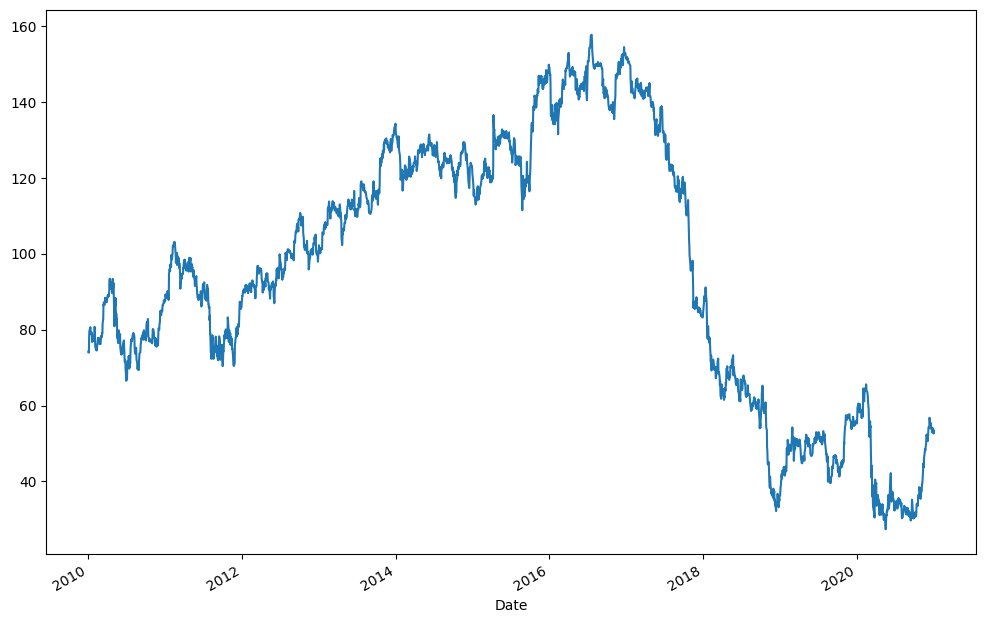

In [9]:
# Line chart
data.Close.GE.plot(figsize=(12, 8))
plt.show()

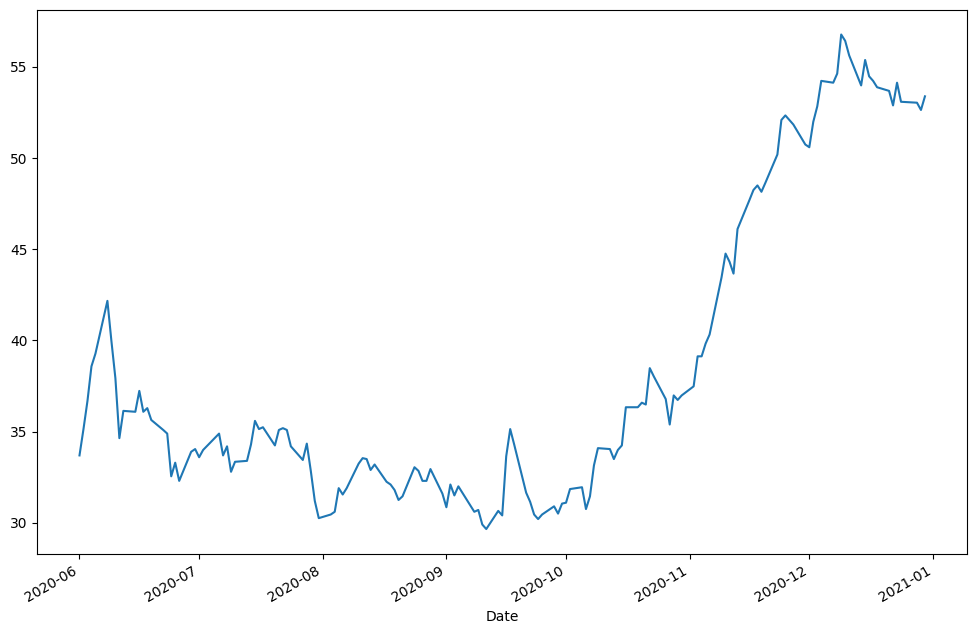

In [10]:
data.loc["2020-06":, ("Close", "GE")].plot(figsize = (12, 8))
plt.show()

In [11]:
# Interactive line chart with Cufflinks
cf.set_config_file(offline=True)
data.loc["2020-06":, ("Close", "GE")].iplot()

In [12]:
data.Close.iplot()

In [13]:
data.Close

Ticker,AAPL,GE,MSFT
Date,,,
2010-01-04 00:00:00+00:00,7.643214,74.043159,30.950001
2010-01-05 00:00:00+00:00,7.656429,74.426552,30.959999
2010-01-06 00:00:00+00:00,7.534643,74.043159,30.770000
2010-01-07 00:00:00+00:00,7.520714,77.877106,30.450001
2010-01-08 00:00:00+00:00,7.570714,79.554459,30.660000
...,...,...,...
2020-12-23 00:00:00+00:00,130.960007,54.127705,221.020004
2020-12-24 00:00:00+00:00,131.970001,53.081036,222.750000
2020-12-28 00:00:00+00:00,136.690002,53.031197,224.960007


In [14]:
# Customize Plotly charts
data.Close.iplot(fill=True)

In [15]:
cf.colors.scales()

In [16]:
data.Close.iplot(fill=True, colorscale="reds")

In [17]:
cf.getThemes()

['ggplot', 'pearl', 'solar', 'space', 'white', 'polar', 'henanigans']

In [18]:
data.Close.iplot(fill=True, colorscale="rdylbu", theme="solar")

In [19]:
data.Close.iplot(fill=True, colorscale="rdylbu", theme="solar", title="US Stocks", xTitle="Time", yTitle="Stock Price")

In [20]:
# Update `/home/yungshun317/envs/yungshun-py3/lib/python3.12/site-packages/cufflinks/plotlytools.py`
data.Close[["GE", "AAPL"]].iplot(kind="spread", fill=True, colorscale="rdylbu", theme="solar", title="GE vs. AAPL", xTitle="Time", yTitle="Stock Price")

In [21]:
data.swaplevel(axis=1).GE

Price,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,
2010-01-04 00:00:00+00:00,53.996006,74.043159,74.953720,72.605423,72.940895,13997032
2010-01-05 00:00:00+00:00,54.275612,74.426552,75.097496,74.043159,74.091080,13469263
2010-01-06 00:00:00+00:00,53.996006,74.043159,74.857872,73.995232,74.426552,11573422
2010-01-07 00:00:00+00:00,56.791939,77.877106,78.979370,73.947311,74.186928,38701038
2010-01-08 00:00:00+00:00,58.015148,79.554459,79.985779,77.972954,78.164658,24019636
...,...,...,...,...,...,...
2020-12-23 00:00:00+00:00,53.300049,54.127705,54.725800,52.931511,53.230560,12139419
2020-12-24 00:00:00+00:00,52.269379,53.081036,54.077862,52.931511,54.077862,6029070
2020-12-28 00:00:00+00:00,52.220306,53.031197,53.728973,52.732147,53.330242,10793588


In [22]:
ge = data.swaplevel(axis=1).GE.copy()
ge

Price,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,
2010-01-04 00:00:00+00:00,53.996006,74.043159,74.953720,72.605423,72.940895,13997032
2010-01-05 00:00:00+00:00,54.275612,74.426552,75.097496,74.043159,74.091080,13469263
2010-01-06 00:00:00+00:00,53.996006,74.043159,74.857872,73.995232,74.426552,11573422
2010-01-07 00:00:00+00:00,56.791939,77.877106,78.979370,73.947311,74.186928,38701038
2010-01-08 00:00:00+00:00,58.015148,79.554459,79.985779,77.972954,78.164658,24019636
...,...,...,...,...,...,...
2020-12-23 00:00:00+00:00,53.300049,54.127705,54.725800,52.931511,53.230560,12139419
2020-12-24 00:00:00+00:00,52.269379,53.081036,54.077862,52.931511,54.077862,6029070
2020-12-28 00:00:00+00:00,52.220306,53.031197,53.728973,52.732147,53.330242,10793588


In [23]:
# Candlestick charts
ge.loc["05-2017"].iplot(kind="candle")

In [24]:
# OHLC Charts
ge.loc["5-2017"].iplot(kind="ohlc")

In [25]:
# https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#anchored-offsets
from pandas.tseries.frequencies import to_offset

weekly = ge.resample("W-Fri").ohlc()
weekly

Price                      Adj Close                                   \
                                open       high        low      close   
Date                                                                    
2010-01-08 00:00:00+00:00  53.996006  58.015148  53.996006  58.015148   
2010-01-15 00:00:00+00:00  58.574337  58.818977  57.455986  57.455986   
2010-01-22 00:00:00+00:00  57.805470  57.805470  55.988117  56.302654   
2010-01-29 00:00:00+00:00  57.211353  57.211353  56.197792  56.197792   
2010-02-05 00:00:00+00:00  56.791939  58.888844  55.184280  55.184280   
...                              ...        ...        ...        ...   
2020-12-04 00:00:00+00:00  49.916744  53.349133  49.769642  53.349133   
2020-12-11 00:00:00+00:00  53.251064  55.849869  53.251064  54.722088   
2020-12-18 00:00:00+00:00  53.103962  54.476917  53.054653  53.054653   
2020-12-25 00:00:00+00:00  52.858349  53.300049  52.073078  52.269379   
2021-01-01 00:00:00+00:00  52.220306  52.563858  51.827679  52.563858   

Price                          Close                                   \
                                open       high        low      close   
Date                                                                    
2010-01-08 00:00:00+00:00  74.043159  79.554459  74.043159  79.554459   
2010-01-15 00:00:00+00:00  80.321251  80.656723  78.787674  78.787674   
2010-01-22 00:00:00+00:00  79.266914  79.266914  76.774849  77.206169   
2010-01-29 00:00:00+00:00  78.452202  78.452202  77.062393  77.062393   
2010-02-05 00:00:00+00:00  77.877106  80.752571  75.672585  75.672585   
...                              ...        ...        ...        ...   
2020-12-04 00:00:00+00:00  50.738495  54.227386  50.588970  54.227386   
2020-12-11 00:00:00+00:00  54.127705  56.769295  54.127705  55.622944   
2020-12-18 00:00:00+00:00  53.978180  55.373737  53.878498  53.878498   
2020-12-25 00:00:00+00:00  53.679134  54.127705  52.881672  53.081036   
2021-01-01 00:00:00+00:00  53.031197  53.380085  52.632465  53.380085   

Price                           High             ...        Low             \
                                open       high  ...        low      close   
Date                                             ...                         
2010-01-08 00:00:00+00:00  74.953720  79.985779  ...  72.605423  77.972954   
2010-01-15 00:00:00+00:00  80.896339  81.088043  ...  78.356354  78.356354   
2010-01-22 00:00:00+00:00  80.273323  80.321251  ...  76.439377  77.110313   
2010-01-29 00:00:00+00:00  79.218987  80.033707  ...  76.726921  77.014465   
2010-02-05 00:00:00+00:00  78.308426  81.615211  ...  73.084671  73.084671   
...                              ...        ...  ...        ...        ...   
2020-12-04 00:00:00+00:00  51.785160  54.476593  ...  49.641983  52.383259   
2020-12-11 00:00:00+00:00  55.323898  57.267712  ...  53.629292  54.925167   
2020-12-18 00:00:00+00:00  56.569931  56.569931  ...  53.081036  53.529610   
2020-12-25 00:00:00+00:00  54.177547  54.725800  ...  51.635635  52.931511   
2021-01-01 00:00:00+00:00  53.728973  54.077862  ...  52.532784  52.582623   

Price                           Open                                   \
                                open       high        low      close   
Date                                                                    
2010-01-08 00:00:00+00:00  72.940895  78.164658  72.940895  78.164658   
2010-01-15 00:00:00+00:00  80.656723  80.656723  79.458611  79.937859   
2010-01-22 00:00:00+00:00  78.356354  79.314842  78.356354  79.314842   
2010-01-29 00:00:00+00:00  78.883522  78.883522  77.733337  77.733337   
2010-02-05 00:00:00+00:00  77.637489  80.465027  76.870697  76.870697   
...                              ...        ...        ...        ...   
2020-12-04 00:00:00+00:00  51.785160  53.180717  50.240082  53.180717   
2020-12-11 00:00:00+00:00  54.277229  56.221043  53.928337  56.221043   
2020-12-18 00:00:00+00:00  56.171200  56.171200  53.728973

In [26]:
weekly = ge.resample("W-Fri").agg({"Open": "first", "High": "max", "Low": "min", "Close": "last"})
weekly

Price,Open,High,Low,Close
Date,,,,
2010-01-08 00:00:00+00:00,72.940895,79.985779,72.605423,79.554459
2010-01-15 00:00:00+00:00,80.656723,81.088043,78.356354,78.787674
2010-01-22 00:00:00+00:00,78.356354,80.321251,76.439377,77.206169
2010-01-29 00:00:00+00:00,78.883522,80.033707,76.726921,77.062393
2010-02-05 00:00:00+00:00,77.637489,81.615211,73.084671,75.672585
...,...,...,...,...
2020-12-04 00:00:00+00:00,51.785160,54.476593,49.641983,54.227386
2020-12-11 00:00:00+00:00,54.277229,57.267712,53.629292,55.622944
2020-12-18 00:00:00+00:00,56.171200,56.569931,53.081036,53.878498


In [27]:
# `pandas.tseries.frequencies.to_offset` returns `DateOffset` object from string or `datetime.timedelta` object
weekly.index = weekly.index - to_offset("4d")

In [28]:
weekly.loc["5-2017":"9-2017"].iplot(kind="candle")

In [29]:
qf = cf.QuantFig(df=ge.loc["5-2017"])
qf

{
    "_d": {
        "close": "Close",
        "high": "High",
        "low": "Low",
        "open": "Open",
        "volume": "Volume"
    },
    "data": {
        "datalegend": true,
        "kind": "candlestick",
        "name": "Trace 1",
        "resample": null,
        "slice": [
            null,
            null
        ]
    },
    "kwargs": {},
    "layout": {
        "annotations": {
            "params": {},
            "values": []
        },
        "margin": {
            "b": 30,
            "l": 30,
            "r": 30,
            "t": 30
        },
        "rangeselector": {
            "visible": false
        },
        "rangeslider": false,
        "shapes": {},
        "showlegend": true
    },
    "panels": {
        "bottom_margin": 0,
        "min_panel_size": 0.15,
        "spacing": 0.08,
        "top_margin": 0.9
    },
    "studies": {},
    "theme": {
        "down_color": "grey",
        "theme": "pearl",
        "up_color": "#17BECF"
    },
    "trend

In [30]:
type(qf)

cufflinks.quant_figure.QuantFig

In [31]:
qf.iplot(title="GE", name="GE")

In [32]:
# Volume charts
qf.add_volume(colorchange=False)

In [33]:
qf.iplot(title="GE", name="GE")

In [34]:
# Technical indicators
ge

Price,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,
2010-01-04 00:00:00+00:00,53.996006,74.043159,74.953720,72.605423,72.940895,13997032
2010-01-05 00:00:00+00:00,54.275612,74.426552,75.097496,74.043159,74.091080,13469263
2010-01-06 00:00:00+00:00,53.996006,74.043159,74.857872,73.995232,74.426552,11573422
2010-01-07 00:00:00+00:00,56.791939,77.877106,78.979370,73.947311,74.186928,38701038
2010-01-08 00:00:00+00:00,58.015148,79.554459,79.985779,77.972954,78.164658,24019636
...,...,...,...,...,...,...
2020-12-23 00:00:00+00:00,53.300049,54.127705,54.725800,52.931511,53.230560,12139419
2020-12-24 00:00:00+00:00,52.269379,53.081036,54.077862,52.931511,54.077862,6029070
2020-12-28 00:00:00+00:00,52.220306,53.031197,53.728973,52.732147,53.330242,10793588


In [35]:
qf = cf.QuantFig(df=ge.loc["2017":"2018"])
qf

{
    "_d": {
        "close": "Close",
        "high": "High",
        "low": "Low",
        "open": "Open",
        "volume": "Volume"
    },
    "data": {
        "datalegend": true,
        "kind": "candlestick",
        "name": "Trace 1",
        "resample": null,
        "slice": [
            null,
            null
        ]
    },
    "kwargs": {},
    "layout": {
        "annotations": {
            "params": {},
            "values": []
        },
        "margin": {
            "b": 30,
            "l": 30,
            "r": 30,
            "t": 30
        },
        "rangeselector": {
            "visible": false
        },
        "rangeslider": false,
        "shapes": {},
        "showlegend": true
    },
    "panels": {
        "bottom_margin": 0,
        "min_panel_size": 0.15,
        "spacing": 0.08,
        "top_margin": 0.9
    },
    "studies": {},
    "theme": {
        "down_color": "grey",
        "theme": "pearl",
        "up_color": "#17BECF"
    },
    "trend

In [36]:
qf.add_sma(periods=20)
qf.iplot(title="GE", name="GE")

In [37]:
qf.add_sma(periods=100)
qf.iplot(title="GE", name="GE")

In [38]:
qf.add_bollinger_bands(periods=20, boll_std=2)
qf.iplot(title="GE", name="GE")

In [39]:
qf = cf.QuantFig(df=ge.loc["5-2017":"9-2017"])
qf.iplot(title="GE", name="GE")

In [40]:
qf.add_macd()
qf.iplot(title="GE", name="GE")

In [41]:
qf.add_dmi()
qf.iplot(title="GE", name="GE")

In [42]:
# Trend lines
qf = cf.QuantFig(df=ge.loc["2012"])
qf.iplot(title="GE", name="GE")

In [43]:
# Uptrend (higher lows)
qf.add_trendline(date0="2012-07-12", date1="2012-09-04")
qf.iplot(title="GE", name="GE")

In [44]:
# Downtrend (Lower Highs)
qf = cf.QuantFig(df=ge.loc["2018"])
qf.iplot(title="GE", name="GE")

In [45]:
qf.add_trendline(date0="2018-05-22", date1="2018-10-09")
qf.iplot(title="GE", name="GE")

In [46]:
qf = cf.QuantFig(df=ge.loc["2012"])
qf.iplot(title="GE", name="GE")

In [47]:
# Resistance lines
qf.add_resistance(date="2012-03-28")
qf.iplot(title="GE", name="GE")

In [48]:
# Support lines
qf = cf.QuantFig(df=ge.loc["2013"])
qf.iplot(title="GE", name="GE")

In [49]:
qf.add_support(date="2013-06-24")
qf.iplot(title="GE", name="GE")

In [50]:
qf = cf.QuantFig(df=ge.loc["2018":"2020"])
qf.add_sma(periods=20)
qf.add_sma(periods=100)
qf.iplot(title="GE", name="GE")

# 2. Buy & Hold Strategy
**Buy & Hold**, also called **Position Trading**, is an investment strategy whereby an investor buys financial assets or non-financial assets such as real estate, to hold them long term, with the goal of realizing price appreciation, despite volatility. This approach implies confidence that the value of the investments will be higher in the future. Also an example of passive management.

In [51]:
plt.style.use("seaborn-v0_8")

data = pd.read_csv("datasets/eurusd.csv", parse_dates=["Date"], index_col="Date")
data

,price
Date,
2004-01-01,1.258194
2004-01-02,1.258194
2004-01-05,1.268698
2004-01-06,1.272103
2004-01-07,1.264095
...,...
2020-06-24,1.131235
2020-06-25,1.125087
2020-06-26,1.122208


In [52]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4275 entries, 2004-01-01 to 2020-06-30
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   price   4275 non-null   float64
dtypes: float64(1)
memory usage: 66.8 KB


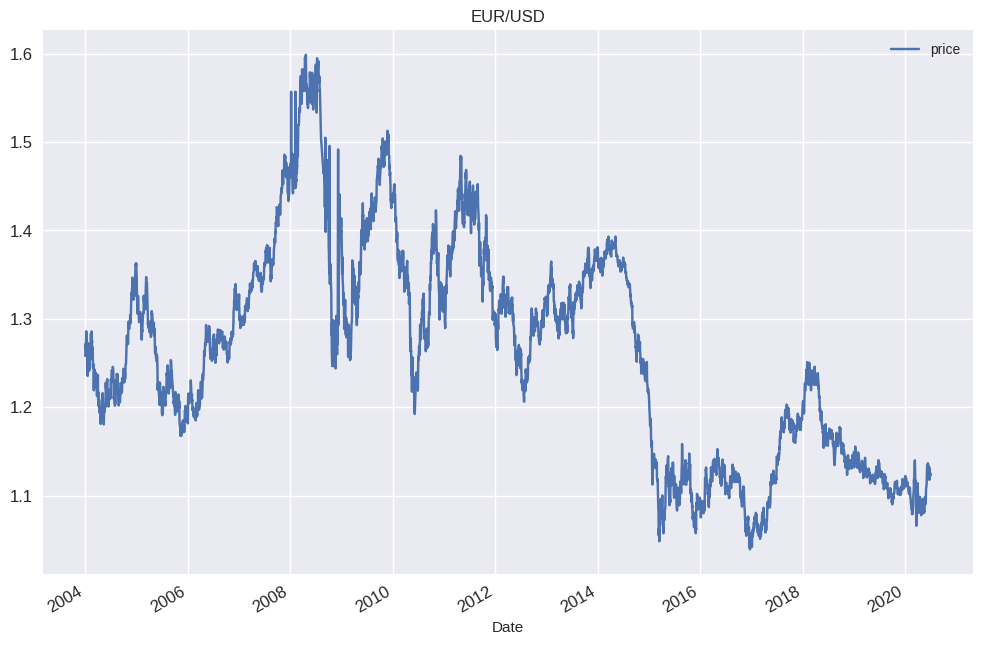

In [53]:
data.plot(figsize=(12, 8), title="EUR/USD", fontsize=12)
plt.show()

In [54]:
data["returns"] = np.log(data.div(data.shift(1)))
data

,price,returns
Date,,
2004-01-01,1.258194,NaN
2004-01-02,1.258194,0.000000
2004-01-05,1.268698,0.008313
2004-01-06,1.272103,0.002681
2004-01-07,1.264095,-0.006315
...,...,...
2020-06-24,1.131235,0.002892
2020-06-25,1.125087,-0.005449
2020-06-26,1.122208,-0.002562


In [55]:
# Create a simple buy & hold strategy
data.dropna(inplace=True)
data

,price,returns
Date,,
2004-01-02,1.258194,0.000000
2004-01-05,1.268698,0.008313
2004-01-06,1.272103,0.002681
2004-01-07,1.264095,-0.006315
2004-01-08,1.277498,0.010547
...,...,...
2020-06-24,1.131235,0.002892
2020-06-25,1.125087,-0.005449
2020-06-26,1.122208,-0.002562


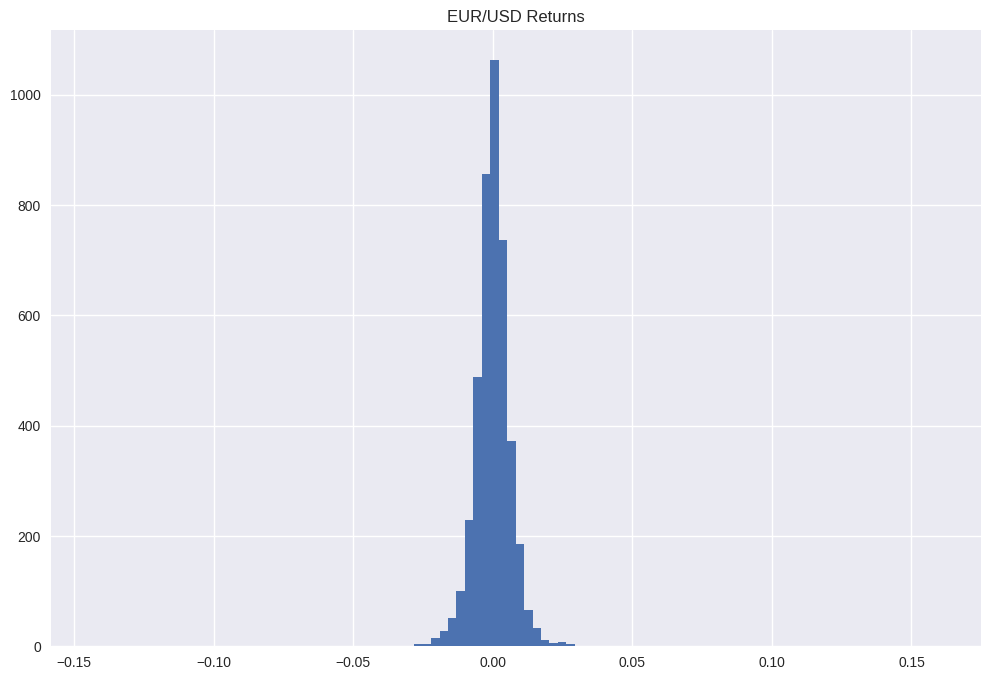

In [56]:
data.returns.hist(bins=100, figsize=(12, 8))
plt.title("EUR/USD Returns")
plt.show()

In [57]:
data.returns.sum()

-0.11214302770699758

In [58]:
np.exp(data.returns.sum())

0.8939163935445148

In [59]:
data.price.iloc[-1] / data.price.iloc[0]

0.8939163935445141

In [60]:
data.returns.cumsum().apply(np.exp)

Date
2004-01-02    1.000000
2004-01-05    1.008348
2004-01-06    1.011055
2004-01-07    1.004690
2004-01-08    1.015343
                ...   
2020-06-24    0.899094
2020-06-25    0.894208
2020-06-26    0.891920
2020-06-29    0.892221
2020-06-30    0.893916
Name: returns, Length: 4274, dtype: float64

In [61]:
data["cum_returns"] = data.returns.cumsum().apply(np.exp)
data

,price,returns,cum_returns
Date,,,
2004-01-02,1.258194,0.000000,1.000000
2004-01-05,1.268698,0.008313,1.008348
2004-01-06,1.272103,0.002681,1.011055
2004-01-07,1.264095,-0.006315,1.004690
2004-01-08,1.277498,0.010547,1.015343
...,...,...,...
2020-06-24,1.131235,0.002892,0.899094
2020-06-25,1.125087,-0.005449,0.894208
2020-06-26,1.122208,-0.002562,0.891920


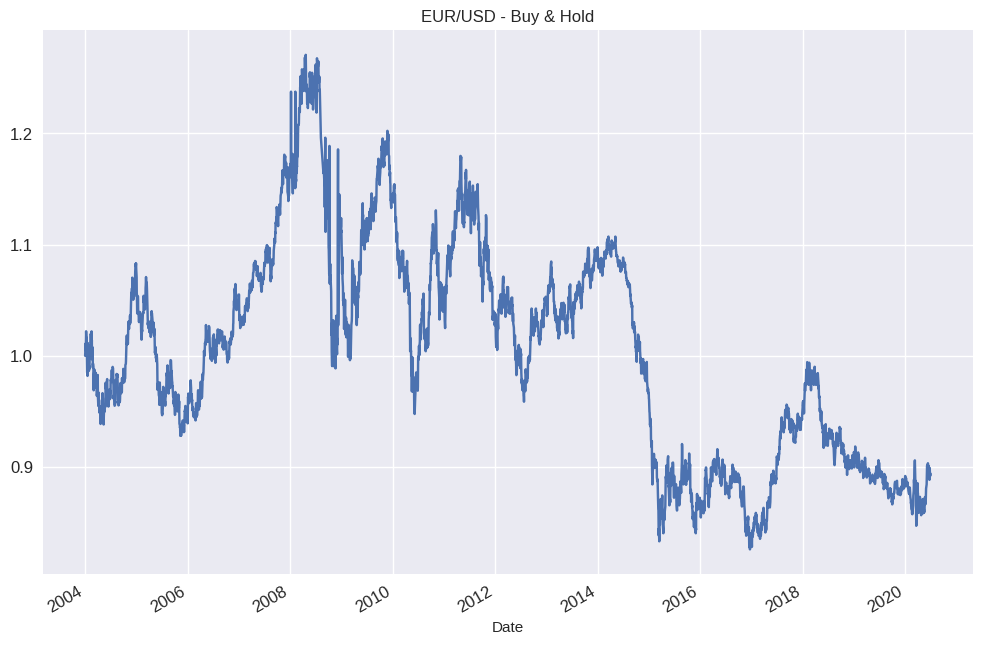

In [62]:
data.cum_returns.plot(figsize=(12, 8), title="EUR/USD - Buy & Hold", fontsize=12)
plt.show()

In [63]:
# Absolute Performance 
data.cum_returns.iloc[-1]

0.8939163935445149

In [64]:
# Absolute Performance
data.returns.sum()

-0.11214302770699758

In [65]:
data.describe()

,price,returns,cum_returns
count,4274.000000,4274.000000,4274.000000
mean,1.262336,-0.000026,1.003292
std,0.122233,0.007593,0.097150
min,1.039047,-0.143324,0.825824
25%,1.145548,-0.003370,0.910470
50%,1.269205,0.000000,1.008751
75%,1.348909,0.003361,1.072099
max,1.598798,0.159632,1.270709


In [66]:
# Annualized mean return & risk
data.returns.mean() * 252

-0.006612083056191715

In [67]:
# Risk
data.returns.std() * np.sqrt(252)

0.12054120479431406

In [68]:
data["cum_max"] = data.cum_returns.cummax()
data

,price,returns,cum_returns,cum_max
Date,,,,
2004-01-02,1.258194,0.000000,1.000000,1.000000
2004-01-05,1.268698,0.008313,1.008348,1.008348
2004-01-06,1.272103,0.002681,1.011055,1.011055
2004-01-07,1.264095,-0.006315,1.004690,1.011055
2004-01-08,1.277498,0.010547,1.015343,1.015343
...,...,...,...,...
2020-06-24,1.131235,0.002892,0.899094,1.270709
2020-06-25,1.125087,-0.005449,0.894208,1.270709
2020-06-26,1.122208,-0.002562,0.891920,1.270709


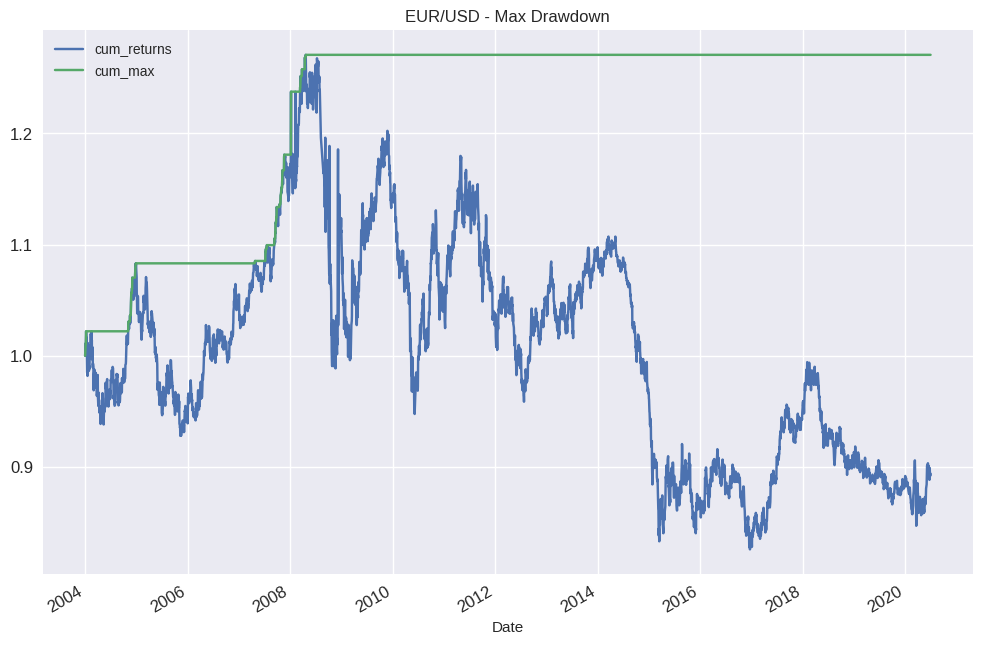

In [69]:
data[["cum_returns", "cum_max"]].dropna().plot(figsize=(12, 8), title="EUR/USD - Max Drawdown", fontsize=12)
plt.show()

In [70]:
drawdown = data["cum_max"] - data["cum_returns"]
drawdown

Date
2004-01-02    0.000000
2004-01-05    0.000000
2004-01-06    0.000000
2004-01-07    0.006365
2004-01-08    0.000000
                ...   
2020-06-24    0.371615
2020-06-25    0.376500
2020-06-26    0.378788
2020-06-29    0.378488
2020-06-30    0.376792
Length: 4274, dtype: float64

In [71]:
# Maximum drawdown
drawdown.max() 

0.4448840569933439

In [72]:
drawdown.idxmax()

Timestamp('2016-12-21 00:00:00')

# 3. Simple Moving Averages (SMA)
## 3-1. Simple Moving Averages (SMA) with pandas

In [73]:
qf = cf.QuantFig(df=ge.loc["2018":"2020"])
qf.add_sma(periods=20)
qf.add_sma(periods=100)
qf.iplot(title="GE", name="GE")

## 3-2. Simple Moving Average Crossovers

In [159]:
data = pd.read_csv("datasets/eurusd.csv", parse_dates=["Date"], index_col="Date")
data

,price
Date,
2004-01-01,1.258194
2004-01-02,1.258194
2004-01-05,1.268698
2004-01-06,1.272103
2004-01-07,1.264095
...,...
2020-06-24,1.131235
2020-06-25,1.125087
2020-06-26,1.122208


In [160]:
data.price.rolling(50).mean()

Date
2004-01-01         NaN
2004-01-02         NaN
2004-01-05         NaN
2004-01-06         NaN
2004-01-07         NaN
                ...   
2020-06-24    1.101794
2020-06-25    1.102486
2020-06-26    1.103213
2020-06-29    1.103931
2020-06-30    1.104695
Name: price, Length: 4275, dtype: float64

In [161]:
sma_short = 50
sma_long = 200

data["SMA_short"] = data.price.rolling(sma_short).mean()
data["SMA_long"] = data.price.rolling(sma_long).mean()
data

,price,SMA_short,SMA_long
Date,,,
2004-01-01,1.258194,NaN,NaN
2004-01-02,1.258194,NaN,NaN
2004-01-05,1.268698,NaN,NaN
2004-01-06,1.272103,NaN,NaN
2004-01-07,1.264095,NaN,NaN
...,...,...,...
2020-06-24,1.131235,1.101794,1.103430
2020-06-25,1.125087,1.102486,1.103540
2020-06-26,1.122208,1.103213,1.103627


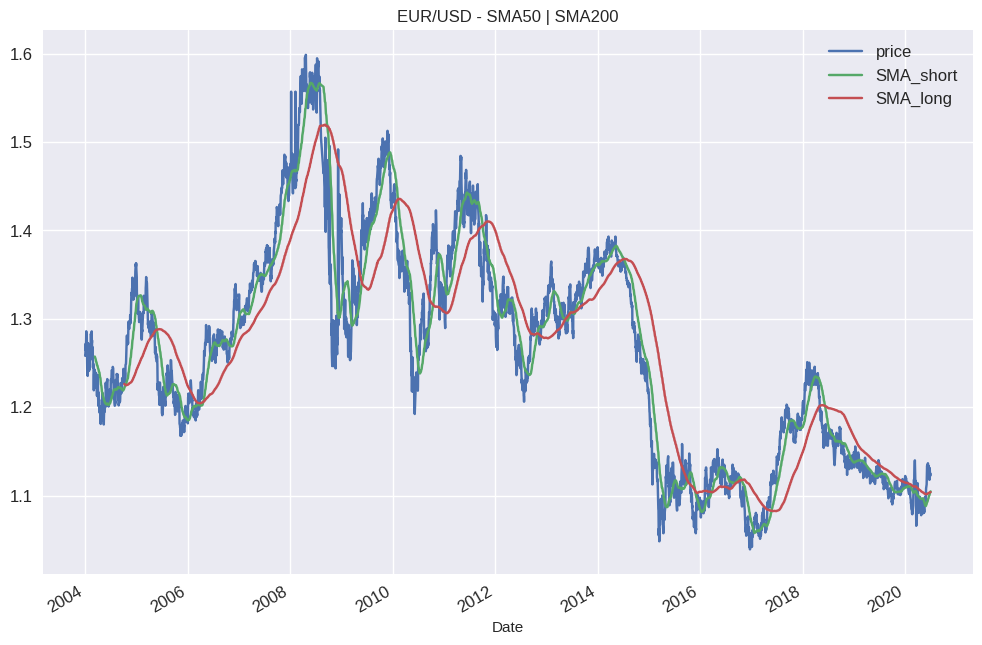

In [162]:
data.plot(figsize=(12, 8), title="EUR/USD - SMA{} | SMA{}".format(sma_short, sma_long), fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [163]:
data.dropna(inplace=True)
data

,price,SMA_short,SMA_long
Date,,,
2004-10-06,1.228094,1.221318,1.226222
2004-10-07,1.229906,1.221840,1.226081
2004-10-08,1.241003,1.222628,1.225995
2004-10-11,1.238405,1.223352,1.225843
2004-10-12,1.232104,1.223888,1.225643
...,...,...,...
2020-06-24,1.131235,1.101794,1.103430
2020-06-25,1.125087,1.102486,1.103540
2020-06-26,1.122208,1.103213,1.103627


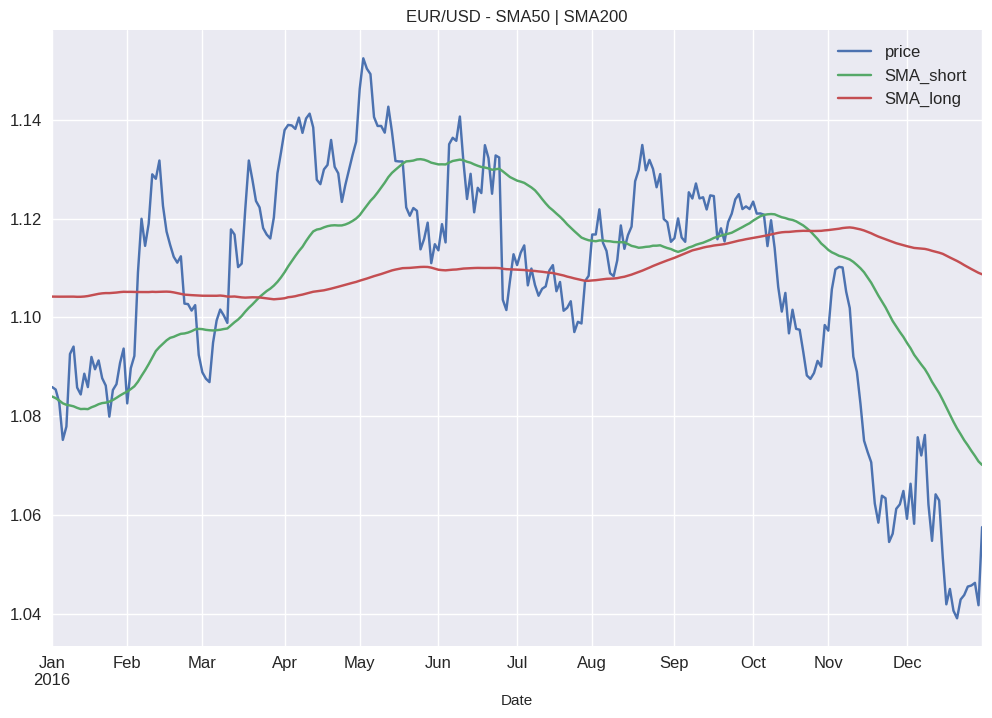

In [164]:
data.loc["2016"].plot(figsize=(12, 8), title="EUR/USD - SMA{} | SMA{}".format(sma_short, sma_long), fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [165]:
# Target position
data["position"] = np.where(data["SMA_short"] > data["SMA_long"], 1, -1)
data

,price,SMA_short,SMA_long,position
Date,,,,
2004-10-06,1.228094,1.221318,1.226222,-1
2004-10-07,1.229906,1.221840,1.226081,-1
2004-10-08,1.241003,1.222628,1.225995,-1
2004-10-11,1.238405,1.223352,1.225843,-1
2004-10-12,1.232104,1.223888,1.225643,-1
...,...,...,...,...
2020-06-24,1.131235,1.101794,1.103430,-1
2020-06-25,1.125087,1.102486,1.103540,-1
2020-06-26,1.122208,1.103213,1.103627,-1


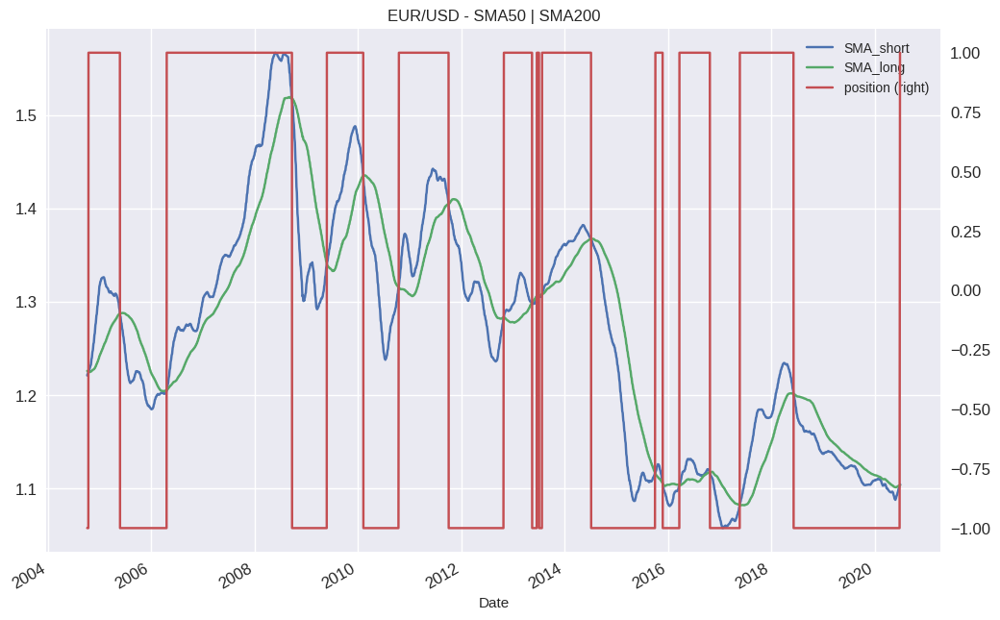

In [166]:
data.loc[:, ["SMA_short", "SMA_long", "position"]].plot(figsize=(12, 8), fontsize=12, secondary_y="position", title="EUR/USD - SMA{} | SMA{}".format(sma_short, sma_long))
plt.show()

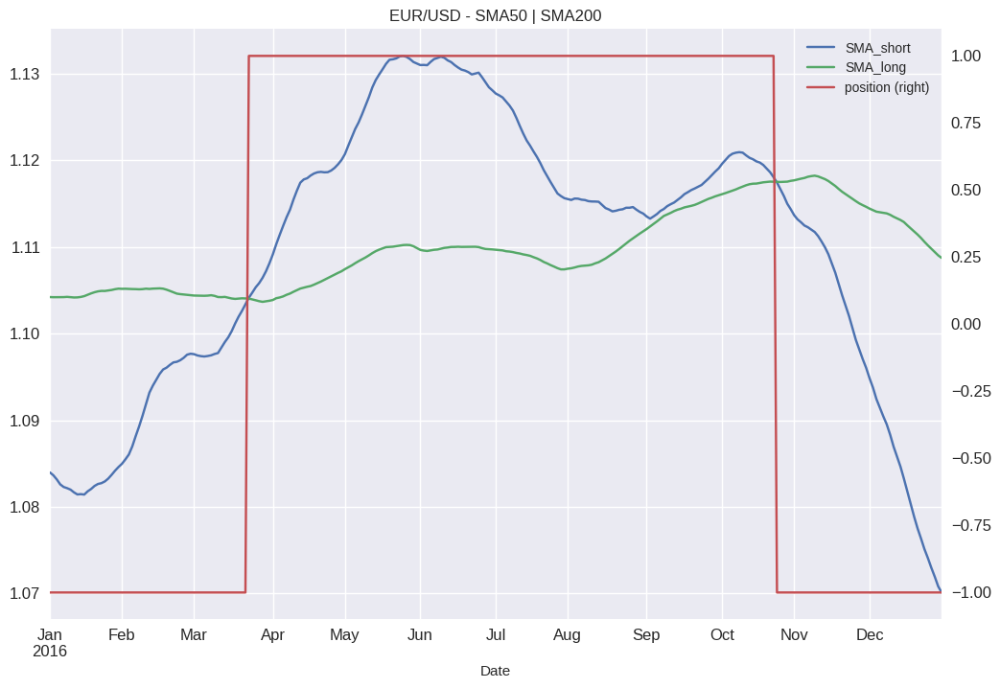

In [167]:
data.loc["2016", ["SMA_short", "SMA_long", "position"]].plot(figsize=(12, 8), fontsize=12, secondary_y="position", title="EUR/USD - SMA{} | SMA{}".format(sma_short, sma_long))
plt.show()

In [168]:
# data["returns_manual"] = (data.price - data.price.shift(1)).div(data.price.shift(1))
data["returns"] = data.price.pct_change()
data

,price,SMA_short,SMA_long,position,returns
Date,,,,,
2004-10-06,1.228094,1.221318,1.226222,-1,NaN
2004-10-07,1.229906,1.221840,1.226081,-1,0.001476
2004-10-08,1.241003,1.222628,1.225995,-1,0.009022
2004-10-11,1.238405,1.223352,1.225843,-1,-0.002093
2004-10-12,1.232104,1.223888,1.225643,-1,-0.005089
...,...,...,...,...,...
2020-06-24,1.131235,1.101794,1.103430,-1,0.002896
2020-06-25,1.125087,1.102486,1.103540,-1,-0.005434
2020-06-26,1.122208,1.103213,1.103627,-1,-0.002559


In [84]:
data["returns"] = np.log(data.price.div(data.price.shift(1)))
data

,price,SMA_short,SMA_long,position,returns
Date,,,,,
2004-10-06,1.228094,1.221318,1.226222,-1,NaN
2004-10-07,1.229906,1.221840,1.226081,-1,0.001475
2004-10-08,1.241003,1.222628,1.225995,-1,0.008982
2004-10-11,1.238405,1.223352,1.225843,-1,-0.002095
2004-10-12,1.232104,1.223888,1.225643,-1,-0.005102
...,...,...,...,...,...
2020-06-24,1.131235,1.101794,1.103430,-1,0.002892
2020-06-25,1.125087,1.102486,1.103540,-1,-0.005449
2020-06-26,1.122208,1.103213,1.103627,-1,-0.002562


In [85]:
data["strategy"] = data.position.shift(1) * data["returns"]
data

,price,SMA_short,SMA_long,position,returns,strategy
Date,,,,,,
2004-10-06,1.228094,1.221318,1.226222,-1,NaN,NaN
2004-10-07,1.229906,1.221840,1.226081,-1,0.001475,-0.001475
2004-10-08,1.241003,1.222628,1.225995,-1,0.008982,-0.008982
2004-10-11,1.238405,1.223352,1.225843,-1,-0.002095,0.002095
2004-10-12,1.232104,1.223888,1.225643,-1,-0.005102,0.005102
...,...,...,...,...,...,...
2020-06-24,1.131235,1.101794,1.103430,-1,0.002892,-0.002892
2020-06-25,1.125087,1.102486,1.103540,-1,-0.005449,0.005449
2020-06-26,1.122208,1.103213,1.103627,-1,-0.002562,0.002562


In [86]:
data.dropna(inplace=True)
data

,price,SMA_short,SMA_long,position,returns,strategy
Date,,,,,,
2004-10-07,1.229906,1.221840,1.226081,-1,0.001475,-0.001475
2004-10-08,1.241003,1.222628,1.225995,-1,0.008982,-0.008982
2004-10-11,1.238405,1.223352,1.225843,-1,-0.002095,0.002095
2004-10-12,1.232104,1.223888,1.225643,-1,-0.005102,0.005102
2004-10-13,1.234903,1.224466,1.225497,-1,0.002270,-0.002270
...,...,...,...,...,...,...
2020-06-24,1.131235,1.101794,1.103430,-1,0.002892,-0.002892
2020-06-25,1.125087,1.102486,1.103540,-1,-0.005449,0.005449
2020-06-26,1.122208,1.103213,1.103627,-1,-0.002562,0.002562


In [87]:
# Absolute performance
data[["returns", "strategy"]].sum()

returns    -0.087929
strategy    0.249591
dtype: float64

In [88]:
# Absolute performance
data[["returns", "strategy"]].sum().apply(np.exp)

returns     0.915826
strategy    1.283500
dtype: float64

In [89]:
# Annualized return
data[["returns", "strategy"]].mean() * 252

returns    -0.005438
strategy    0.015435
dtype: float64

In [90]:
# Annualized risk
data[["returns", "strategy"]].std() * np.sqrt(252)

returns     0.120806
strategy    0.120802
dtype: float64

In [91]:
data["cum_returns"] = data["returns"].cumsum().apply(np.exp)
data["cum_strategy"] = data["strategy"].cumsum().apply(np.exp)
data

,price,SMA_short,SMA_long,position,returns,strategy,cum_returns,cum_strategy
Date,,,,,,,,
2004-10-07,1.229906,1.221840,1.226081,-1,0.001475,-0.001475,1.001476,0.998526
2004-10-08,1.241003,1.222628,1.225995,-1,0.008982,-0.008982,1.010511,0.989598
2004-10-11,1.238405,1.223352,1.225843,-1,-0.002095,0.002095,1.008396,0.991673
2004-10-12,1.232104,1.223888,1.225643,-1,-0.005102,0.005102,1.003265,0.996746
2004-10-13,1.234903,1.224466,1.225497,-1,0.002270,-0.002270,1.005545,0.994486
...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.101794,1.103430,-1,0.002892,-0.002892,0.921130,1.271272
2020-06-25,1.125087,1.102486,1.103540,-1,-0.005449,0.005449,0.916125,1.278218
2020-06-26,1.122208,1.103213,1.103627,-1,-0.002562,0.002562,0.913781,1.281497


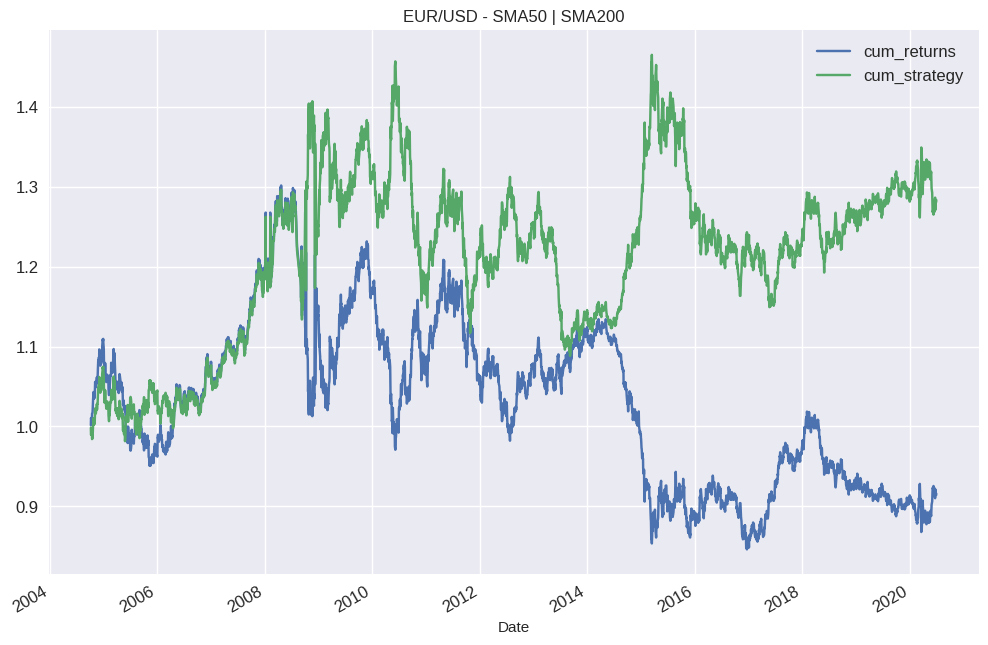

In [92]:
data[["cum_returns", "cum_strategy"]].plot(figsize=(12, 8), title="EUR/USD - SMA{} | SMA{}".format(sma_short, sma_long), fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [93]:
outperform = data.cum_strategy.iloc[-1] - data.cum_returns.iloc[-1]
outperform

0.3676743925451291

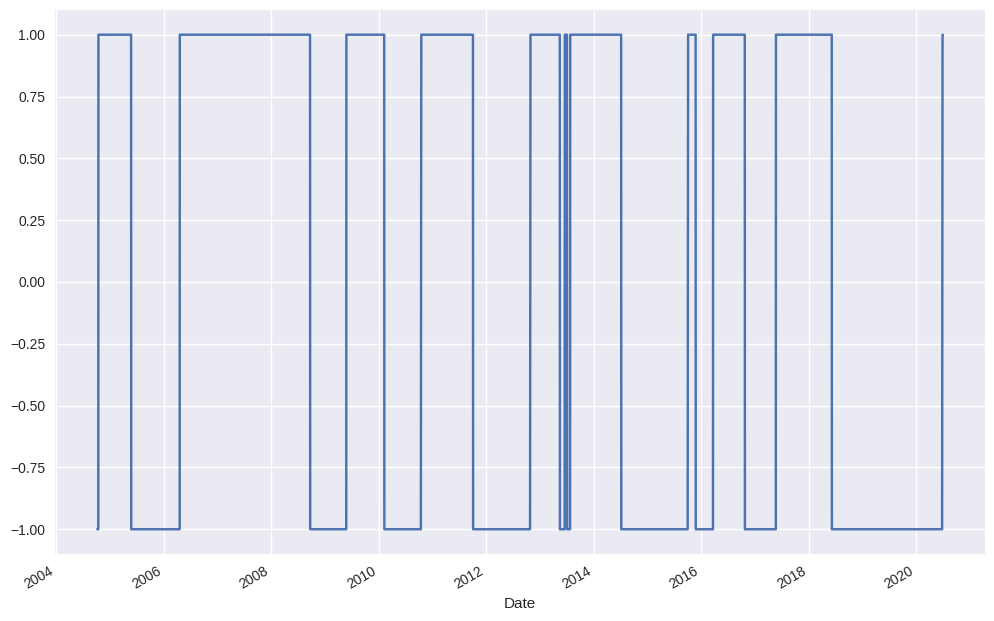

In [94]:
# Trading costs
data.loc[:, "position"].plot(figsize=(12, 8))
plt.show()

In [95]:
data.position.diff().fillna(0).abs()

Date
2004-10-07    0.0
2004-10-08    0.0
2004-10-11    0.0
2004-10-12    0.0
2004-10-13    0.0
             ... 
2020-06-24    0.0
2020-06-25    0.0
2020-06-26    0.0
2020-06-29    2.0
2020-06-30    0.0
Name: position, Length: 4075, dtype: float64

In [96]:
data["trades"] = data.position.diff().fillna(0).abs()
data

,price,SMA_short,SMA_long,position,returns,strategy,cum_returns,cum_strategy,trades
Date,,,,,,,,,
2004-10-07,1.229906,1.221840,1.226081,-1,0.001475,-0.001475,1.001476,0.998526,0.0
2004-10-08,1.241003,1.222628,1.225995,-1,0.008982,-0.008982,1.010511,0.989598,0.0
2004-10-11,1.238405,1.223352,1.225843,-1,-0.002095,0.002095,1.008396,0.991673,0.0
2004-10-12,1.232104,1.223888,1.225643,-1,-0.005102,0.005102,1.003265,0.996746,0.0
2004-10-13,1.234903,1.224466,1.225497,-1,0.002270,-0.002270,1.005545,0.994486,0.0
...,...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.101794,1.103430,-1,0.002892,-0.002892,0.921130,1.271272,0.0
2020-06-25,1.125087,1.102486,1.103540,-1,-0.005449,0.005449,0.916125,1.278218,0.0
2020-06-26,1.122208,1.103213,1.103627,-1,-0.002562,0.002562,0.913781,1.281497,0.0


In [97]:
data.trades.value_counts()

trades
0.0    4054
2.0      21
Name: count, dtype: int64

In [98]:
# Simplified approximation for vectorized backtesting
spread = 1.5 * 0.0001 
commissions = 0

# Absolute transaction cost per trade (position change +-1)
half_spread = spread / 2 
half_spread * 100000

# Proportional transaction cost per trade (position change +-1)
ptc = half_spread / data.price.mean() 
ptc

5.93304228050709e-05

In [99]:
ptc = 0.00007
data["strategy_net"] = data.strategy - data.trades * ptc
data["cum_strategy_net"] = data.strategy_net.cumsum().apply(np.exp)
data

,price,SMA_short,SMA_long,position,returns,strategy,cum_returns,cum_strategy,trades,strategy_net,cum_strategy_net
Date,,,,,,,,,,,
2004-10-07,1.229906,1.221840,1.226081,-1,0.001475,-0.001475,1.001476,0.998526,0.0,-0.001475,0.998526
2004-10-08,1.241003,1.222628,1.225995,-1,0.008982,-0.008982,1.010511,0.989598,0.0,-0.008982,0.989598
2004-10-11,1.238405,1.223352,1.225843,-1,-0.002095,0.002095,1.008396,0.991673,0.0,0.002095,0.991673
2004-10-12,1.232104,1.223888,1.225643,-1,-0.005102,0.005102,1.003265,0.996746,0.0,0.005102,0.996746
2004-10-13,1.234903,1.224466,1.225497,-1,0.002270,-0.002270,1.005545,0.994486,0.0,-0.002270,0.994486
...,...,...,...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.101794,1.103430,-1,0.002892,-0.002892,0.921130,1.271272,0.0,-0.002892,1.267717
2020-06-25,1.125087,1.102486,1.103540,-1,-0.005449,0.005449,0.916125,1.278218,0.0,0.005449,1.274644
2020-06-26,1.122208,1.103213,1.103627,-1,-0.002562,0.002562,0.913781,1.281497,0.0,0.002562,1.277914


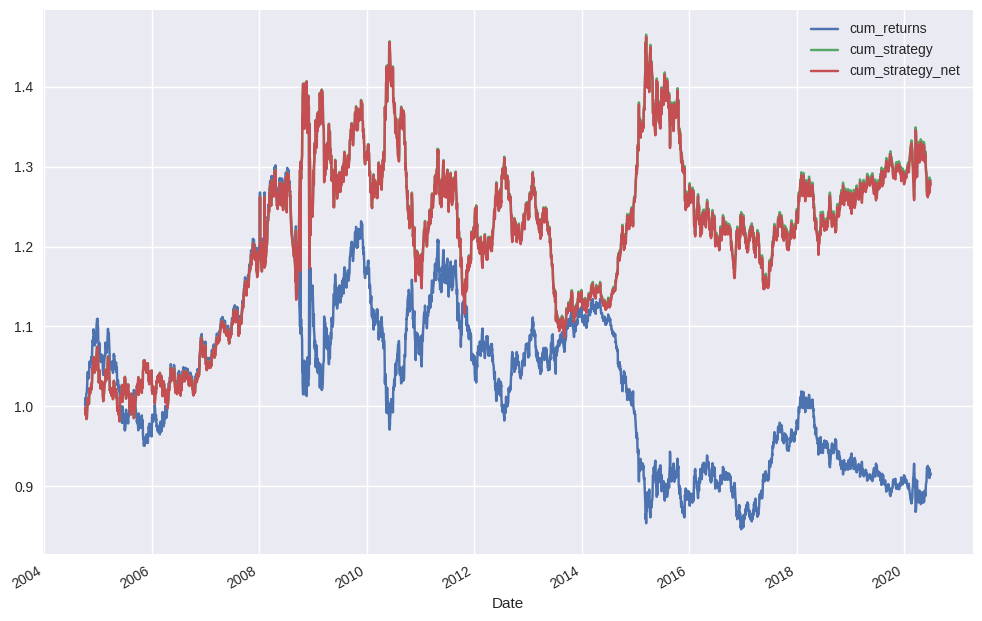

In [100]:
data[["cum_returns", "cum_strategy", "cum_strategy_net"]].plot(figsize=(12 , 8))
plt.show()

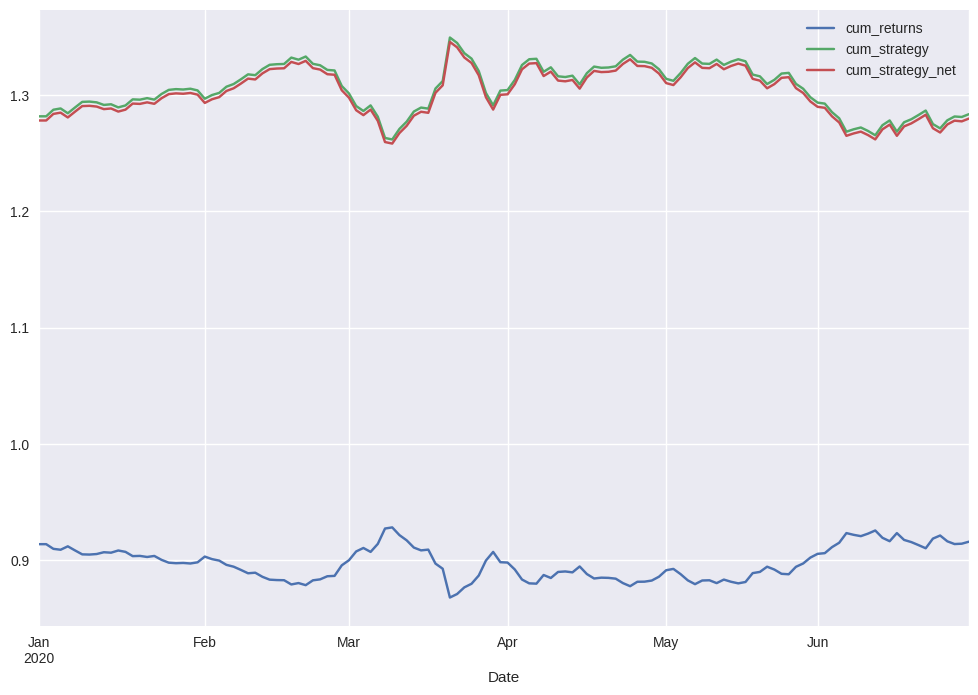

In [101]:
data.loc["2020", ["cum_returns", "cum_strategy", "cum_strategy_net"]].plot(figsize=(12 , 8))
plt.show()

In [102]:
# Strategy optimization
data = pd.read_csv("datasets/eurusd.csv", parse_dates=["Date"], index_col="Date")
data

,price
Date,
2004-01-01,1.258194
2004-01-02,1.258194
2004-01-05,1.268698
2004-01-06,1.272103
2004-01-07,1.264095
...,...
2020-06-24,1.131235
2020-06-25,1.125087
2020-06-26,1.122208


In [103]:
def run_strategy(SMA, data):
    data = data.copy()
    data["returns"] = np.log(data.price.div(data.price.shift(1)))
    data["SMA_short"] = data.price.rolling(int(SMA[0])).mean()
    data["SMA_long"] = data.price.rolling(int(SMA[1])).mean()
    data.dropna(inplace=True)
    
    data["position"] = np.where(data["SMA_short"] > data["SMA_long"], 1, -1)
    data["strategy"] = data.position.shift(1) * data["returns"]
    data.dropna(inplace=True)
        
    return data[["returns", "strategy"]].sum().apply(np.exp).iloc[-1]

In [104]:
run_strategy((50, 200), data)

1.2835003323288487

In [105]:
run_strategy((10, 50), data)

0.9869996463269878

In [106]:
run_strategy((22, 252), data)

1.149280327487213

In [107]:
def run_strategy(SMA, data):
    data = data.copy()
    data["returns"] = np.log(data.price.div(data.price.shift(1)))
    data["SMA_short"] = data.price.rolling(int(SMA[0])).mean()
    data["SMA_long"] = data.price.rolling(int(SMA[1])).mean()
    data.dropna(inplace=True)
    
    data["position"] = np.where(data["SMA_short"] > data["SMA_long"], 1, -1)
    data["strategy"] = data.position.shift(1) * data["returns"]
    data.dropna(inplace=True)
    
    # Maximize absolute performance
    return -data[["returns", "strategy"]].sum().apply(np.exp).iloc[-1] 

In [108]:
# Find the optmial SMA strategy
from scipy.optimize import brute

brute(run_strategy, ranges=((10, 50, 1), (100, 252, 1)), args=(data,))

array([ 46., 137.])

In [109]:
-run_strategy((46, 137), data)

2.5266939897810787

# 4. Exponential Moving Averages (EMA)

In [110]:
qf = cf.QuantFig(df=ge.loc["2018":"2020"])
qf.add_ema(periods=20)
qf.add_ema(periods=100)
qf.iplot(title="GE", name="GE")

## 4-1. Exponential Moving Averages (EMA) with pandas

In [111]:
data = pd.read_csv("datasets/eurusd.csv", parse_dates=["Date"], index_col="Date")
data

,price
Date,
2004-01-01,1.258194
2004-01-02,1.258194
2004-01-05,1.268698
2004-01-06,1.272103
2004-01-07,1.264095
...,...
2020-06-24,1.131235
2020-06-25,1.125087
2020-06-26,1.122208


In [112]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4275 entries, 2004-01-01 to 2020-06-30
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   price   4275 non-null   float64
dtypes: float64(1)
memory usage: 66.8 KB


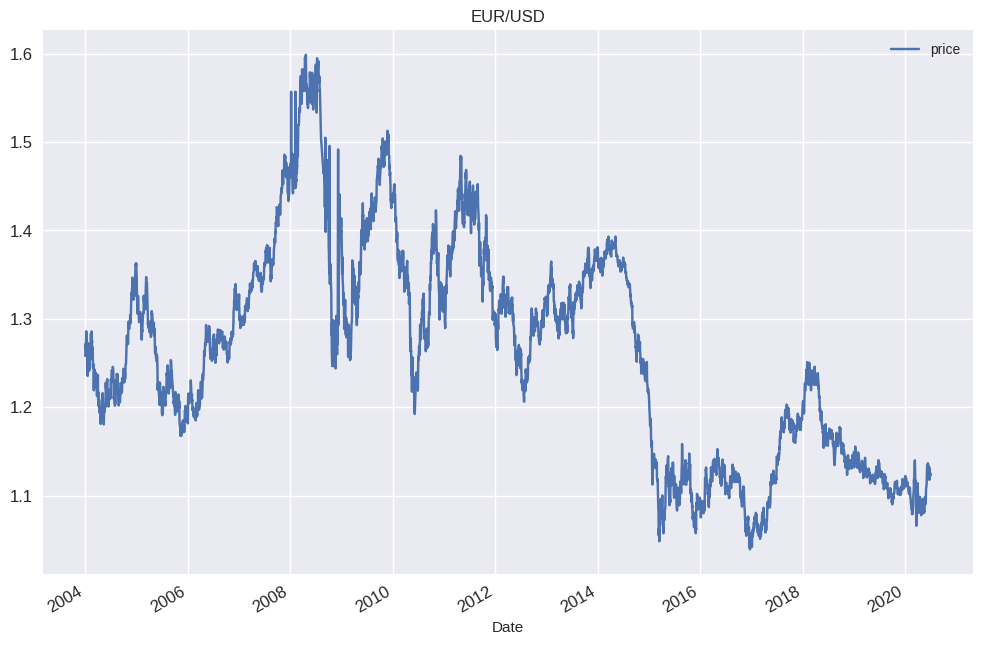

In [113]:
data.plot(figsize=(12, 8), title="EUR/USD", fontsize=12)
plt.show()

In [114]:
# Compare EMA with SMA
window = 50

data.price.ewm(span=window, min_periods=window).mean()

Date
2004-01-01         NaN
2004-01-02         NaN
2004-01-05         NaN
2004-01-06         NaN
2004-01-07         NaN
                ...   
2020-06-24    1.109674
2020-06-25    1.110279
2020-06-26    1.110746
2020-06-29    1.111211
2020-06-30    1.111741
Name: price, Length: 4275, dtype: float64

In [115]:
data["EMA_short"] = data.price.ewm(span=window, min_periods=window).mean()
data["SMA_short"] = data.price.rolling(window).mean()
data

,price,EMA_short,SMA_short
Date,,,
2004-01-01,1.258194,NaN,NaN
2004-01-02,1.258194,NaN,NaN
2004-01-05,1.268698,NaN,NaN
2004-01-06,1.272103,NaN,NaN
2004-01-07,1.264095,NaN,NaN
...,...,...,...
2020-06-24,1.131235,1.109674,1.101794
2020-06-25,1.125087,1.110279,1.102486
2020-06-26,1.122208,1.110746,1.103213


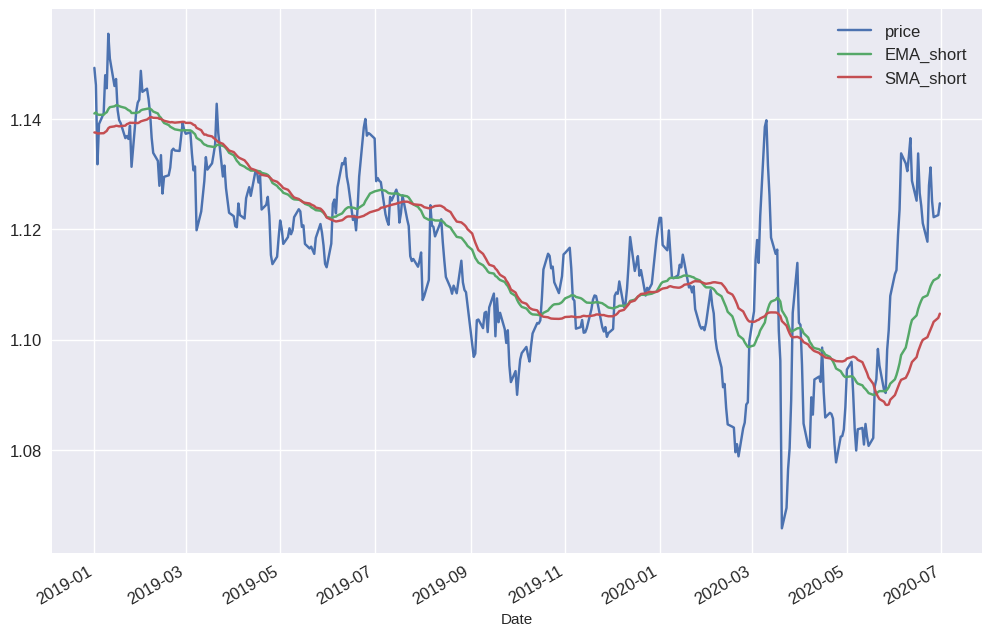

In [116]:
data.loc["2019":].plot(figsize=(12, 8), fontsize=12)
plt.legend(fontsize=12)
plt.show()

## 4-2. Exponential Moving Average Crossovers

In [117]:
data.drop(columns = ["EMA_short", "SMA_short"], inplace = True)
data

,price
Date,
2004-01-01,1.258194
2004-01-02,1.258194
2004-01-05,1.268698
2004-01-06,1.272103
2004-01-07,1.264095
...,...
2020-06-24,1.131235
2020-06-25,1.125087
2020-06-26,1.122208


In [118]:
ema_short = 50
ema_long = 200

data["EMA_short"] = data.price.ewm(span=ema_short, min_periods=ema_short).mean()
data["EMA_long"] = data.price.ewm(span=ema_long, min_periods=ema_long).mean()
data

,price,EMA_short,EMA_long
Date,,,
2004-01-01,1.258194,NaN,NaN
2004-01-02,1.258194,NaN,NaN
2004-01-05,1.268698,NaN,NaN
2004-01-06,1.272103,NaN,NaN
2004-01-07,1.264095,NaN,NaN
...,...,...,...
2020-06-24,1.131235,1.109674,1.106470
2020-06-25,1.125087,1.110279,1.106655
2020-06-26,1.122208,1.110746,1.106810


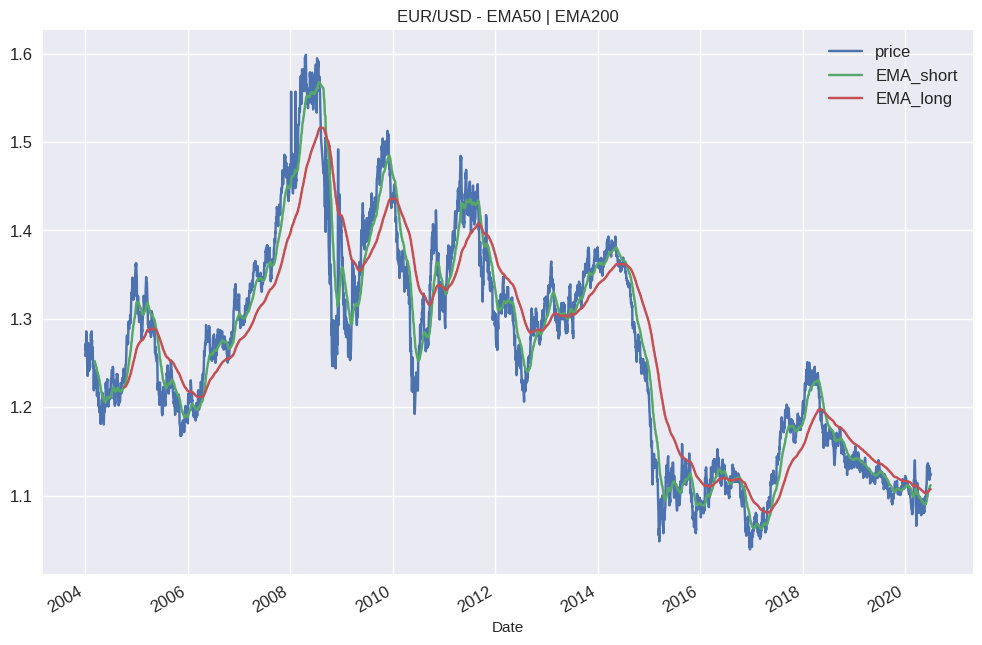

In [119]:
data.plot(figsize=(12, 8), title="EUR/USD - EMA{} | EMA{}".format(ema_short, ema_long), fontsize=12)
plt.legend(fontsize = 12)
plt.show()

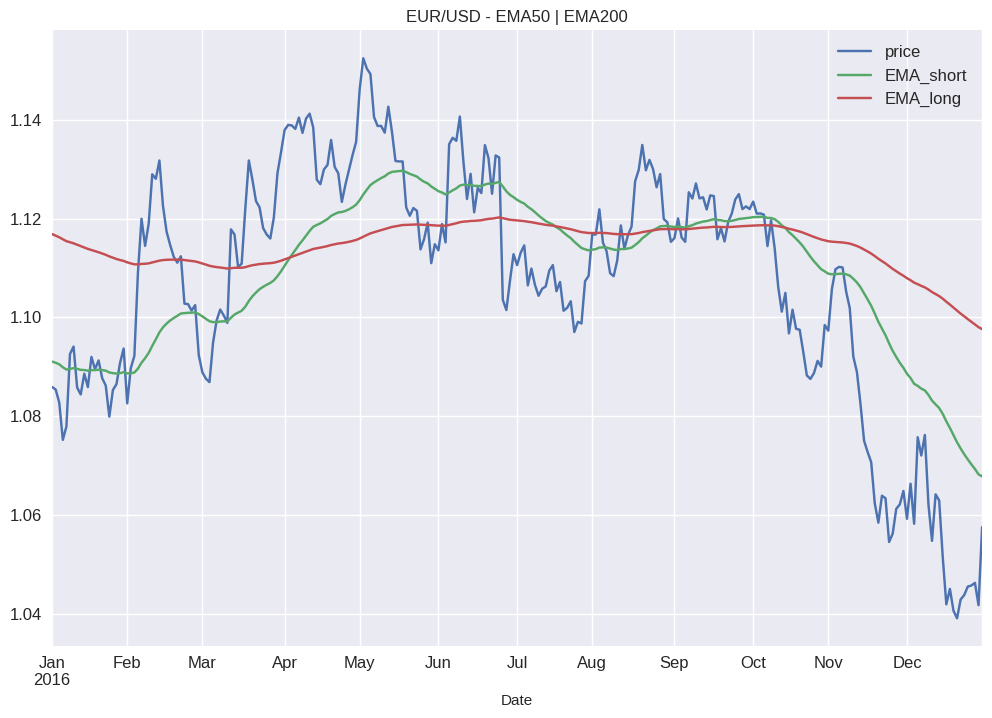

In [120]:
data.loc["2016", ["price", "EMA_short", "EMA_long"]].plot(figsize=(12, 8), fontsize=12, title="EUR/USD - EMA{} | EMA{}".format(ema_short, ema_long))
plt.legend(fontsize=12)
plt.show()

In [121]:
data["position"] = np.where(data["EMA_short"] > data["EMA_long"], 1, -1)
data

,price,EMA_short,EMA_long,position
Date,,,,
2004-01-01,1.258194,NaN,NaN,-1
2004-01-02,1.258194,NaN,NaN,-1
2004-01-05,1.268698,NaN,NaN,-1
2004-01-06,1.272103,NaN,NaN,-1
2004-01-07,1.264095,NaN,NaN,-1
...,...,...,...,...
2020-06-24,1.131235,1.109674,1.106470,1
2020-06-25,1.125087,1.110279,1.106655,1
2020-06-26,1.122208,1.110746,1.106810,1


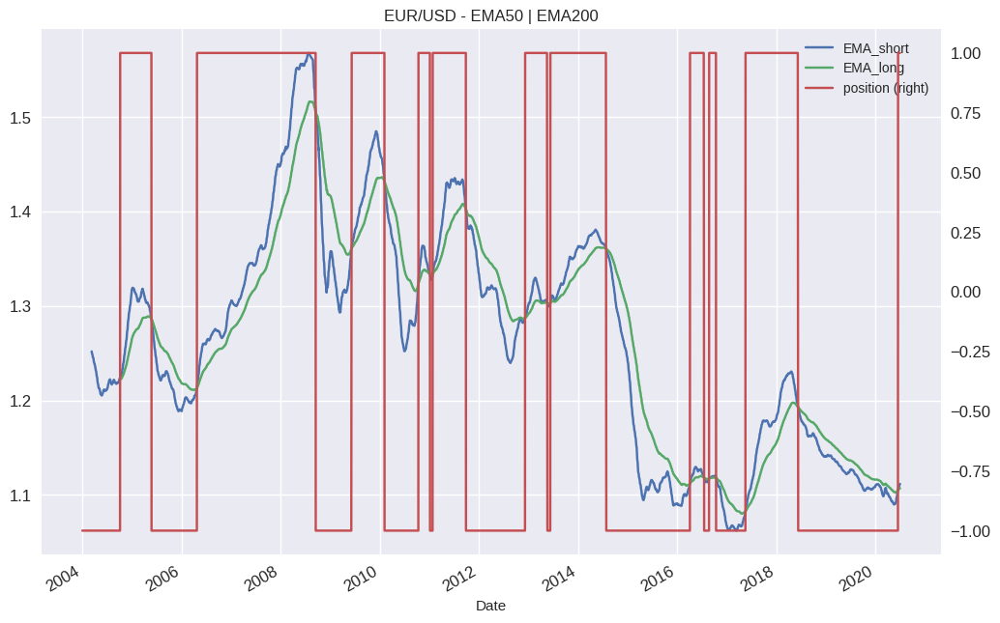

In [122]:
data.loc[:, ["EMA_short", "EMA_long", "position"]].plot(figsize=(12, 8), fontsize=12, secondary_y="position", title="EUR/USD - EMA{} | EMA{}".format(ema_short, ema_long))
plt.show()

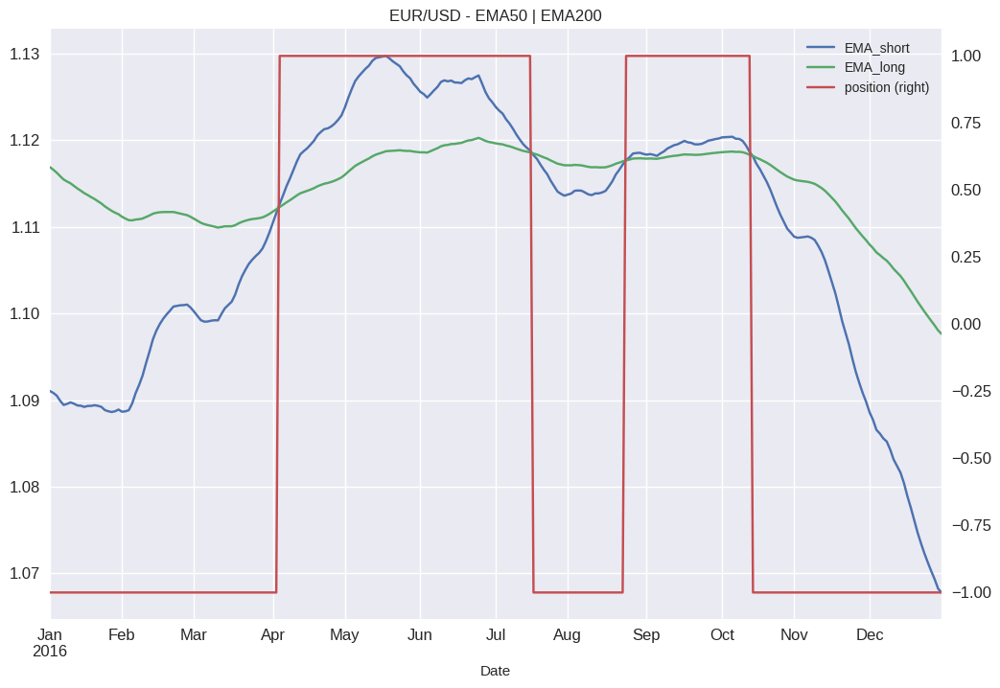

In [123]:
data.loc["2016", ["EMA_short", "EMA_long", "position"]].plot(figsize=(12, 8), fontsize=12, secondary_y="position", title="EUR/USD - EMA{} | EMA{}".format(ema_short, ema_long))
plt.show()

In [124]:
# Vectorized strategy backtesting
data["returns"] = np.log(data.price.div(data.price.shift(1)))
data

,price,EMA_short,EMA_long,position,returns
Date,,,,,
2004-01-01,1.258194,NaN,NaN,-1,NaN
2004-01-02,1.258194,NaN,NaN,-1,0.000000
2004-01-05,1.268698,NaN,NaN,-1,0.008313
2004-01-06,1.272103,NaN,NaN,-1,0.002681
2004-01-07,1.264095,NaN,NaN,-1,-0.006315
...,...,...,...,...,...
2020-06-24,1.131235,1.109674,1.106470,1,0.002892
2020-06-25,1.125087,1.110279,1.106655,1,-0.005449
2020-06-26,1.122208,1.110746,1.106810,1,-0.002562


In [125]:
data.dropna(inplace=True)
data

,price,EMA_short,EMA_long,position,returns
Date,,,,,
2004-10-06,1.228094,1.223852,1.222221,1,-0.002853
2004-10-07,1.229906,1.224089,1.222309,1,0.001475
2004-10-08,1.241003,1.224753,1.222524,1,0.008982
2004-10-11,1.238405,1.225288,1.222706,1,-0.002095
2004-10-12,1.232104,1.225556,1.222813,1,-0.005102
...,...,...,...,...,...
2020-06-24,1.131235,1.109674,1.106470,1,0.002892
2020-06-25,1.125087,1.110279,1.106655,1,-0.005449
2020-06-26,1.122208,1.110746,1.106810,1,-0.002562


In [126]:
data["strategy"] = data.position.shift(1) * data["returns"]
data

,price,EMA_short,EMA_long,position,returns,strategy
Date,,,,,,
2004-10-06,1.228094,1.223852,1.222221,1,-0.002853,NaN
2004-10-07,1.229906,1.224089,1.222309,1,0.001475,0.001475
2004-10-08,1.241003,1.224753,1.222524,1,0.008982,0.008982
2004-10-11,1.238405,1.225288,1.222706,1,-0.002095,-0.002095
2004-10-12,1.232104,1.225556,1.222813,1,-0.005102,-0.005102
...,...,...,...,...,...,...
2020-06-24,1.131235,1.109674,1.106470,1,0.002892,0.002892
2020-06-25,1.125087,1.110279,1.106655,1,-0.005449,-0.005449
2020-06-26,1.122208,1.110746,1.106810,1,-0.002562,-0.002562


In [127]:
data.dropna(inplace=True)
data

,price,EMA_short,EMA_long,position,returns,strategy
Date,,,,,,
2004-10-07,1.229906,1.224089,1.222309,1,0.001475,0.001475
2004-10-08,1.241003,1.224753,1.222524,1,0.008982,0.008982
2004-10-11,1.238405,1.225288,1.222706,1,-0.002095,-0.002095
2004-10-12,1.232104,1.225556,1.222813,1,-0.005102,-0.005102
2004-10-13,1.234903,1.225922,1.222951,1,0.002270,0.002270
...,...,...,...,...,...,...
2020-06-24,1.131235,1.109674,1.106470,1,0.002892,0.002892
2020-06-25,1.125087,1.110279,1.106655,1,-0.005449,-0.005449
2020-06-26,1.122208,1.110746,1.106810,1,-0.002562,-0.002562


In [128]:
data["trades"] = data.position.diff().fillna(0).abs()
data

,price,EMA_short,EMA_long,position,returns,strategy,trades
Date,,,,,,,
2004-10-07,1.229906,1.224089,1.222309,1,0.001475,0.001475,0.0
2004-10-08,1.241003,1.224753,1.222524,1,0.008982,0.008982,0.0
2004-10-11,1.238405,1.225288,1.222706,1,-0.002095,-0.002095,0.0
2004-10-12,1.232104,1.225556,1.222813,1,-0.005102,-0.005102,0.0
2004-10-13,1.234903,1.225922,1.222951,1,0.002270,0.002270,0.0
...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.109674,1.106470,1,0.002892,0.002892,0.0
2020-06-25,1.125087,1.110279,1.106655,1,-0.005449,-0.005449,0.0
2020-06-26,1.122208,1.110746,1.106810,1,-0.002562,-0.002562,0.0


In [129]:
data.trades.value_counts()

trades
0.0    4055
2.0      20
Name: count, dtype: int64

In [130]:
# Consider trading costs
ptc = 0.00007
data["strategy_net"] = data.strategy - data.trades * ptc
data

,price,EMA_short,EMA_long,position,returns,strategy,trades,strategy_net
Date,,,,,,,,
2004-10-07,1.229906,1.224089,1.222309,1,0.001475,0.001475,0.0,0.001475
2004-10-08,1.241003,1.224753,1.222524,1,0.008982,0.008982,0.0,0.008982
2004-10-11,1.238405,1.225288,1.222706,1,-0.002095,-0.002095,0.0,-0.002095
2004-10-12,1.232104,1.225556,1.222813,1,-0.005102,-0.005102,0.0,-0.005102
2004-10-13,1.234903,1.225922,1.222951,1,0.002270,0.002270,0.0,0.002270
...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.109674,1.106470,1,0.002892,0.002892,0.0,0.002892
2020-06-25,1.125087,1.110279,1.106655,1,-0.005449,-0.005449,0.0,-0.005449
2020-06-26,1.122208,1.110746,1.106810,1,-0.002562,-0.002562,0.0,-0.002562


In [131]:
data["cum_returns"] = data["returns"].cumsum().apply(np.exp)
data["cum_strategy"] = data["strategy"].cumsum().apply(np.exp)
data["cum_strategy_net"] = data["strategy_net"].cumsum().apply(np.exp)
data

,price,EMA_short,EMA_long,position,returns,strategy,trades,strategy_net,cum_returns,cum_strategy,cum_strategy_net
Date,,,,,,,,,,,
2004-10-07,1.229906,1.224089,1.222309,1,0.001475,0.001475,0.0,0.001475,1.001476,1.001476,1.001476
2004-10-08,1.241003,1.224753,1.222524,1,0.008982,0.008982,0.0,0.008982,1.010511,1.010511,1.010511
2004-10-11,1.238405,1.225288,1.222706,1,-0.002095,-0.002095,0.0,-0.002095,1.008396,1.008396,1.008396
2004-10-12,1.232104,1.225556,1.222813,1,-0.005102,-0.005102,0.0,-0.005102,1.003265,1.003265,1.003265
2004-10-13,1.234903,1.225922,1.222951,1,0.002270,0.002270,0.0,0.002270,1.005545,1.005545,1.005545
...,...,...,...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.109674,1.106470,1,0.002892,0.002892,0.0,0.002892,0.921130,1.283363,1.279774
2020-06-25,1.125087,1.110279,1.106655,1,-0.005449,-0.005449,0.0,-0.005449,0.916125,1.276389,1.272820
2020-06-26,1.122208,1.110746,1.106810,1,-0.002562,-0.002562,0.0,-0.002562,0.913781,1.273123,1.269563


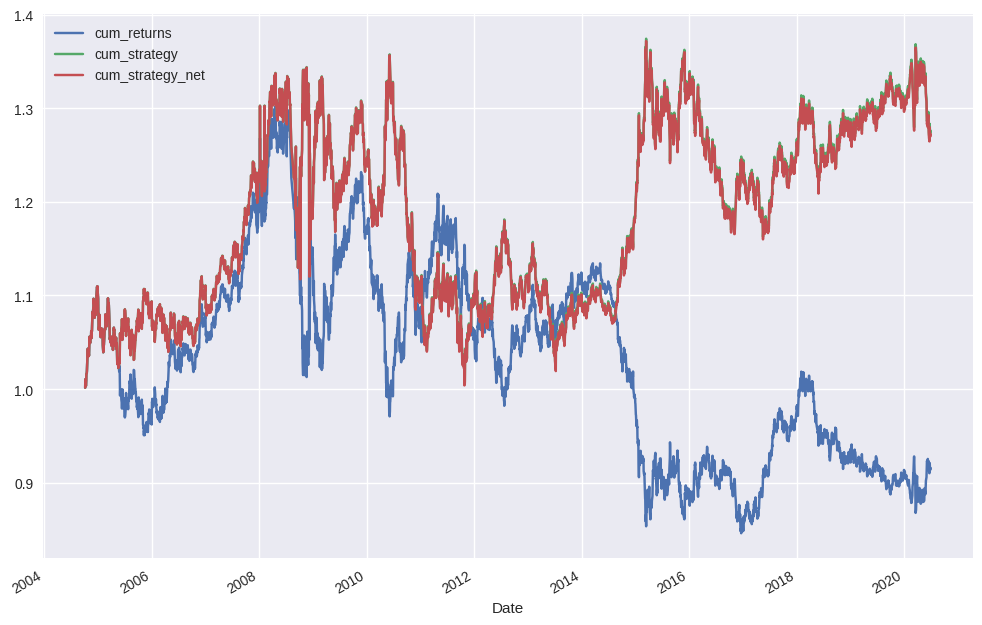

In [132]:
data[["cum_returns", "cum_strategy", "cum_strategy_net"]].plot(figsize=(12 , 8))
plt.show()

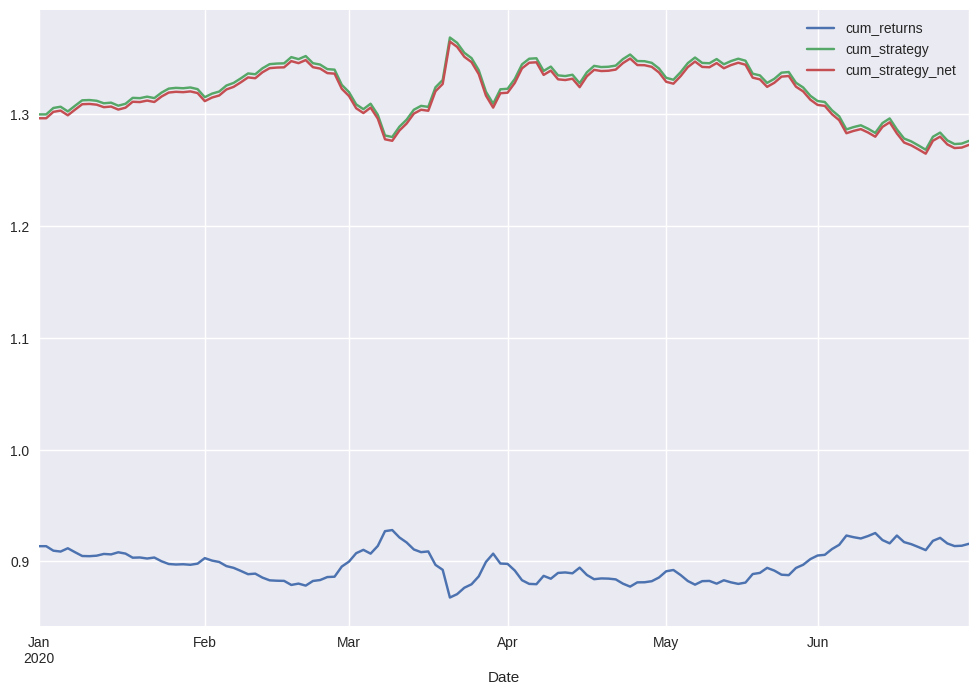

In [133]:
data.loc["2020", ["cum_returns", "cum_strategy", "cum_strategy_net"]].plot(figsize=(12, 8))
plt.show()

# 5. Moving Average Crossover Strategy

In [134]:
qf = cf.QuantFig(df=ge.loc["2018":"2019"])
qf.add_sma(periods=50)
qf.add_ema(periods=50)
qf.iplot(title="GE", name="GE")

# 6. Moving Average Convergence/Divergence (MACD)

In [135]:
qf = cf.QuantFig(df=ge.loc["2018":"2020"])
qf.add_macd()
qf.iplot(title="GE", name="GE")

## 6-1. Moving Average Convergence/Divergence (MACD) with pandas

In [136]:
data = pd.read_csv("datasets/eurusd.csv", parse_dates=["Date"], index_col="Date")
data

,price
Date,
2004-01-01,1.258194
2004-01-02,1.258194
2004-01-05,1.268698
2004-01-06,1.272103
2004-01-07,1.264095
...,...
2020-06-24,1.131235
2020-06-25,1.125087
2020-06-26,1.122208


In [137]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4275 entries, 2004-01-01 to 2020-06-30
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   price   4275 non-null   float64
dtypes: float64(1)
memory usage: 66.8 KB


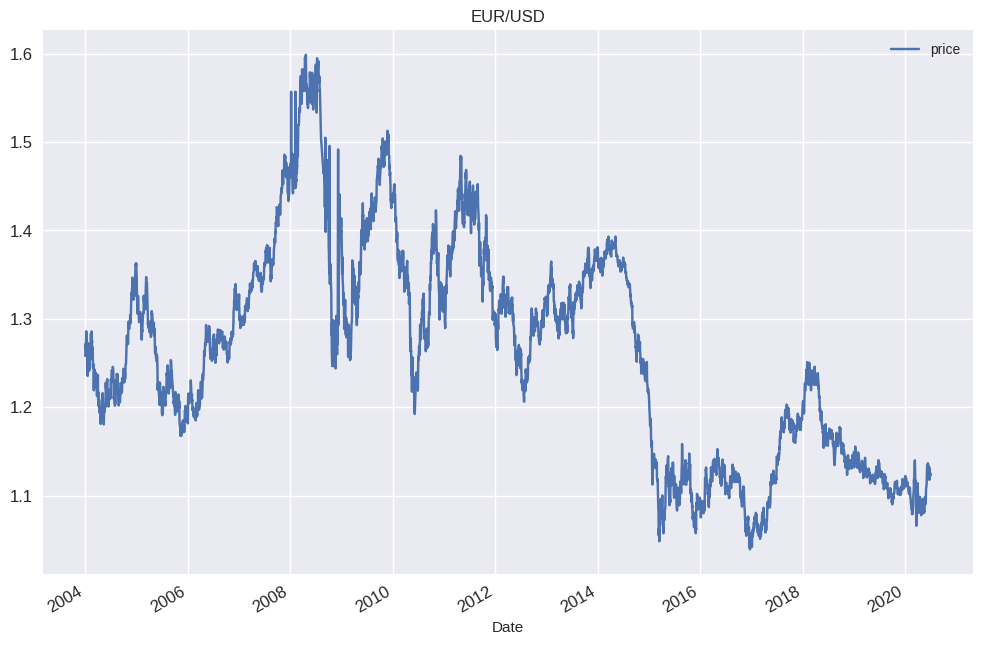

In [138]:
data.plot(figsize=(12, 8), title="EUR/USD", fontsize=12)
plt.show()

In [139]:
# Define a MACD strategy
ema_short = 12
ema_long = 26

data["EMA_short"] = data.price.ewm(span=ema_short, min_periods=ema_short).mean()
data["EMA_long"] = data.price.ewm(span=ema_long, min_periods=ema_long).mean()
data

,price,EMA_short,EMA_long
Date,,,
2004-01-01,1.258194,NaN,NaN
2004-01-02,1.258194,NaN,NaN
2004-01-05,1.268698,NaN,NaN
2004-01-06,1.272103,NaN,NaN
2004-01-07,1.264095,NaN,NaN
...,...,...,...
2020-06-24,1.131235,1.125123,1.117852
2020-06-25,1.125087,1.125118,1.118388
2020-06-26,1.122208,1.124670,1.118671


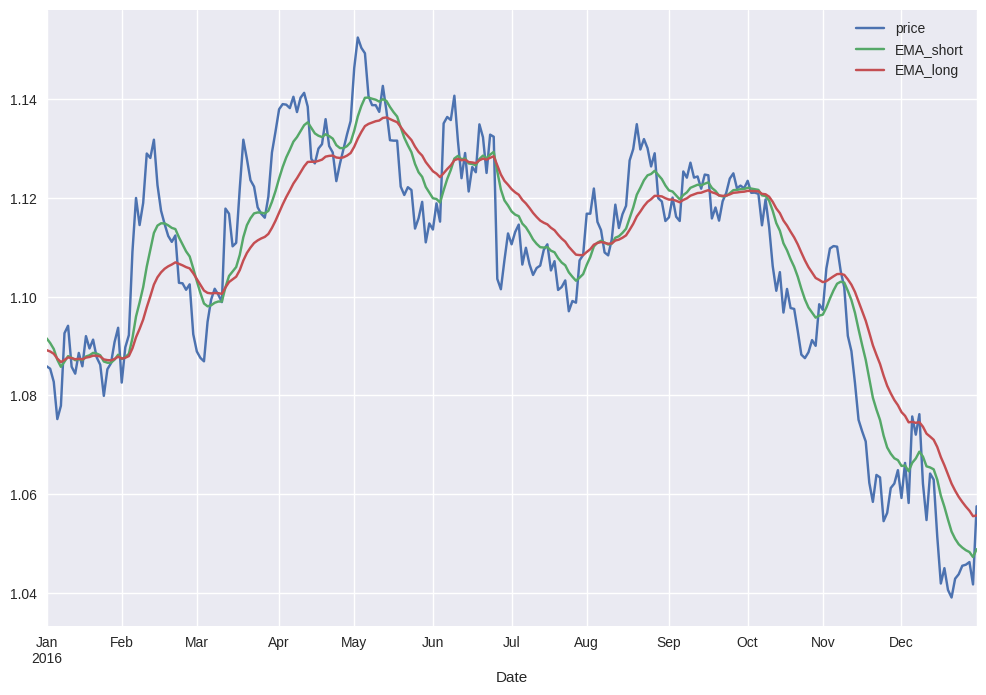

In [140]:
data.loc["2016", ["price", "EMA_short", "EMA_long"]].plot(figsize=(12, 8))
plt.show()

In [141]:
data["MACD"] = data.EMA_short - data.EMA_long
data

,price,EMA_short,EMA_long,MACD
Date,,,,
2004-01-01,1.258194,NaN,NaN,NaN
2004-01-02,1.258194,NaN,NaN,NaN
2004-01-05,1.268698,NaN,NaN,NaN
2004-01-06,1.272103,NaN,NaN,NaN
2004-01-07,1.264095,NaN,NaN,NaN
...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272
2020-06-25,1.125087,1.125118,1.118388,0.006730
2020-06-26,1.122208,1.124670,1.118671,0.005999


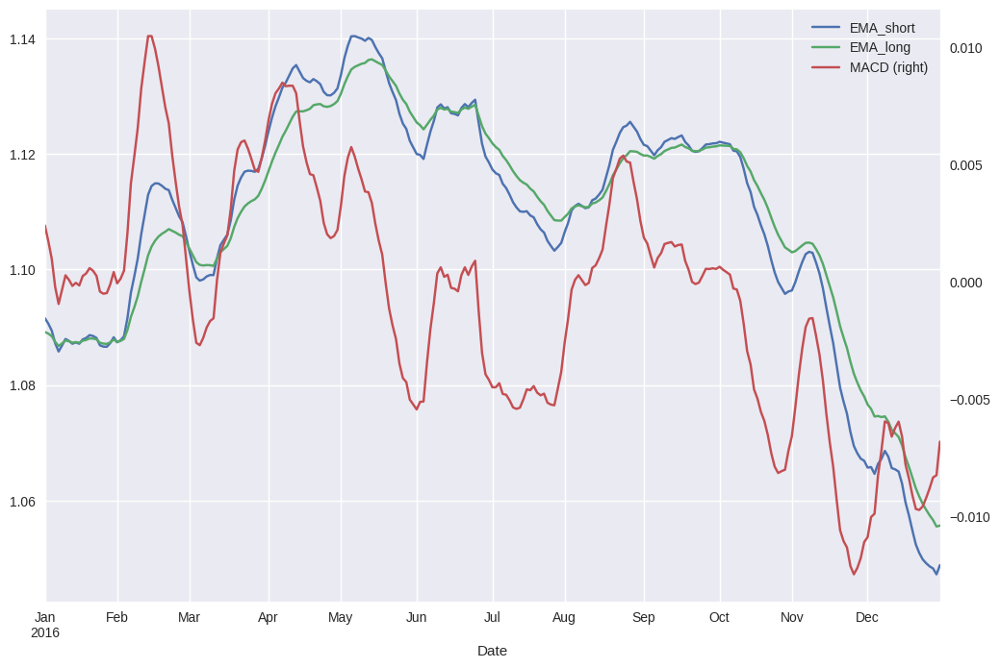

In [142]:
data.loc["2016", ["EMA_short", "EMA_long", "MACD"]].plot(figsize=(12, 8), secondary_y = "MACD")
plt.show()

In [143]:
# Moving window for signal line
signal_moving_window = 9

data["MACD_signal"] = data.MACD.ewm(span=signal_moving_window, min_periods=signal_moving_window).mean()
data

,price,EMA_short,EMA_long,MACD,MACD_signal
Date,,,,,
2004-01-01,1.258194,NaN,NaN,NaN,NaN
2004-01-02,1.258194,NaN,NaN,NaN,NaN
2004-01-05,1.268698,NaN,NaN,NaN,NaN
2004-01-06,1.272103,NaN,NaN,NaN,NaN
2004-01-07,1.264095,NaN,NaN,NaN,NaN
...,...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272,0.008516
2020-06-25,1.125087,1.125118,1.118388,0.006730,0.008158
2020-06-26,1.122208,1.124670,1.118671,0.005999,0.007727


In [144]:
data.loc["2016"]

,price,EMA_short,EMA_long,MACD,MACD_signal
Date,,,,,
2016-01-01,1.085906,1.091559,1.089167,0.002392,0.002641
2016-01-04,1.085399,1.090611,1.088888,0.001723,0.002458
2016-01-05,1.082755,1.089402,1.088433,0.000969,0.002160
2016-01-06,1.075199,1.087217,1.087453,-0.000236,0.001681
2016-01-07,1.077900,1.085784,1.086745,-0.000962,0.001152
...,...,...,...,...,...
2016-12-26,1.045478,1.049165,1.058405,-0.009240,-0.008833
2016-12-27,1.045697,1.048631,1.057464,-0.008832,-0.008833
2016-12-28,1.046233,1.048262,1.056632,-0.008370,-0.008740


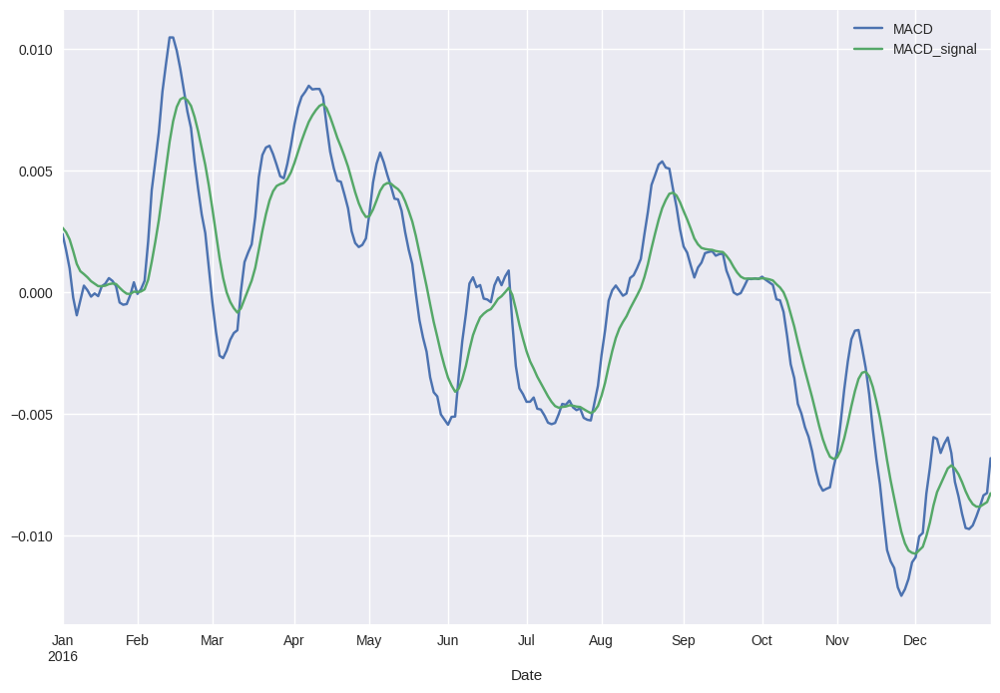

In [145]:
data.loc["2016", ["MACD", "MACD_signal"]].plot(figsize=(12, 8))
plt.show()

In [146]:
# Define an MACD strategy
data["position"] = np.where(data.MACD - data.MACD_signal > 0, 1, -1)
data

,price,EMA_short,EMA_long,MACD,MACD_signal,position
Date,,,,,,
2004-01-01,1.258194,NaN,NaN,NaN,NaN,-1
2004-01-02,1.258194,NaN,NaN,NaN,NaN,-1
2004-01-05,1.268698,NaN,NaN,NaN,NaN,-1
2004-01-06,1.272103,NaN,NaN,NaN,NaN,-1
2004-01-07,1.264095,NaN,NaN,NaN,NaN,-1
...,...,...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272,0.008516,-1
2020-06-25,1.125087,1.125118,1.118388,0.006730,0.008158,-1
2020-06-26,1.122208,1.124670,1.118671,0.005999,0.007727,-1


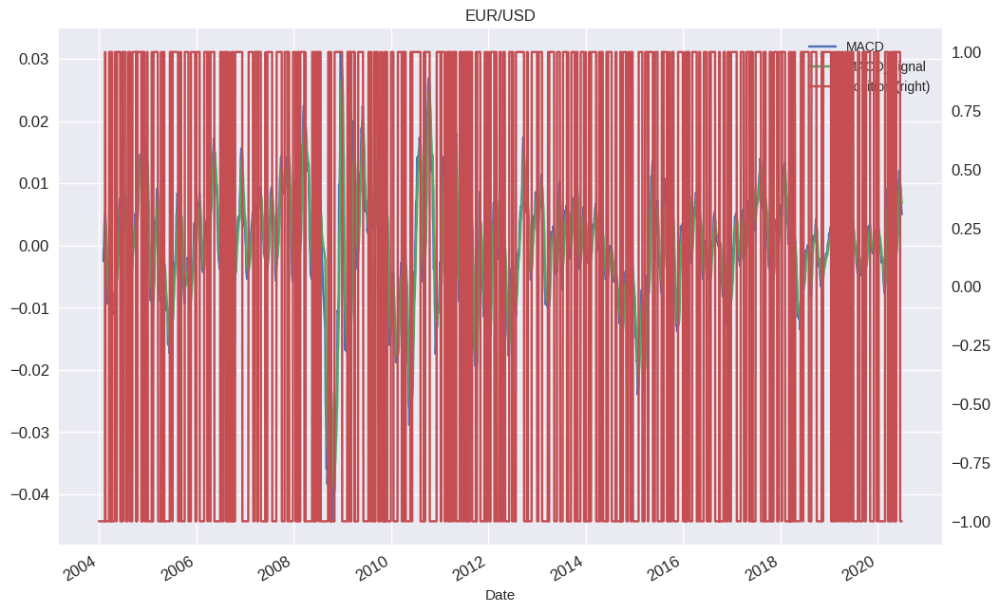

In [147]:
data.loc[:, ["MACD", "MACD_signal", "position"]].plot(figsize=(12, 8), fontsize=12, secondary_y="position", title="EUR/USD")
plt.show()

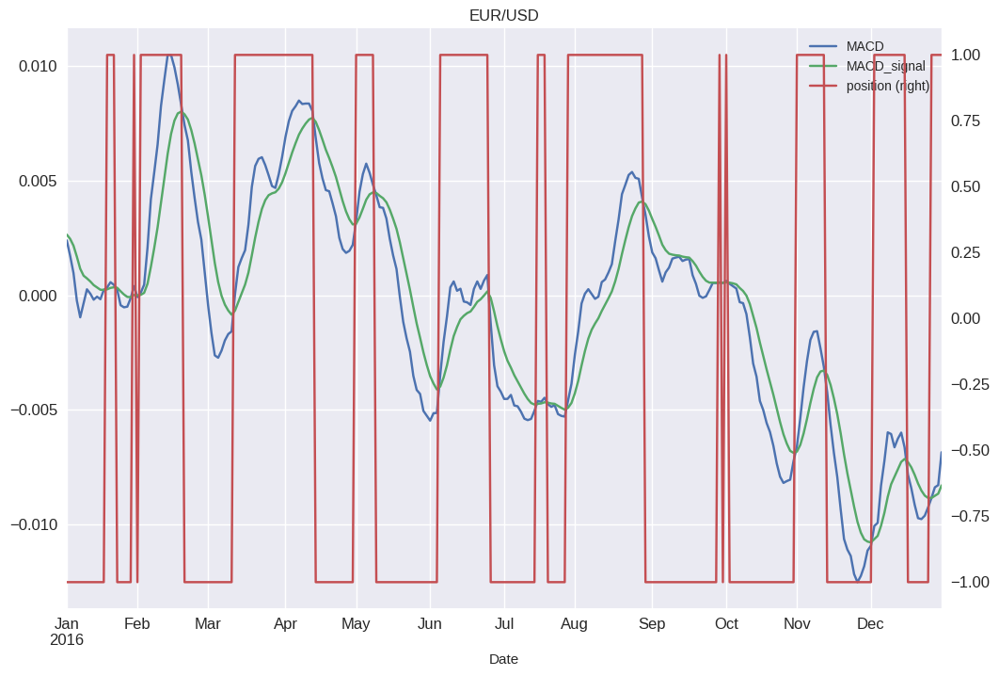

In [148]:
data.loc["2016", ["MACD", "MACD_signal", "position"]].plot(figsize=(12, 8), fontsize=12, secondary_y="position", title="EUR/USD")
plt.show()

In [149]:
# Vectorized strategy backtesting
data["returns"] = np.log(data.price.div(data.price.shift(1)))
data

,price,EMA_short,EMA_long,MACD,MACD_signal,position,returns
Date,,,,,,,
2004-01-01,1.258194,NaN,NaN,NaN,NaN,-1,NaN
2004-01-02,1.258194,NaN,NaN,NaN,NaN,-1,0.000000
2004-01-05,1.268698,NaN,NaN,NaN,NaN,-1,0.008313
2004-01-06,1.272103,NaN,NaN,NaN,NaN,-1,0.002681
2004-01-07,1.264095,NaN,NaN,NaN,NaN,-1,-0.006315
...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272,0.008516,-1,0.002892
2020-06-25,1.125087,1.125118,1.118388,0.006730,0.008158,-1,-0.005449
2020-06-26,1.122208,1.124670,1.118671,0.005999,0.007727,-1,-0.002562


In [150]:
data.dropna(inplace = True)
data

,price,EMA_short,EMA_long,MACD,MACD_signal,position,returns
Date,,,,,,,
2004-02-17,1.285793,1.271256,1.266191,0.005065,0.003018,1,0.007251
2004-02-18,1.272508,1.271449,1.266693,0.004756,0.003408,1,-0.010386
2004-02-19,1.275705,1.272106,1.267405,0.004700,0.003691,1,0.002510
2004-02-20,1.254202,1.269345,1.266367,0.002978,0.003538,-1,-0.017000
2004-02-23,1.257197,1.267473,1.265649,0.001824,0.003175,-1,0.002386
...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272,0.008516,-1,0.002892
2020-06-25,1.125087,1.125118,1.118388,0.006730,0.008158,-1,-0.005449
2020-06-26,1.122208,1.124670,1.118671,0.005999,0.007727,-1,-0.002562


In [151]:
data["strategy"] = data.position.shift(1) * data["returns"]
data

,price,EMA_short,EMA_long,MACD,MACD_signal,position,returns,strategy
Date,,,,,,,,
2004-02-17,1.285793,1.271256,1.266191,0.005065,0.003018,1,0.007251,NaN
2004-02-18,1.272508,1.271449,1.266693,0.004756,0.003408,1,-0.010386,-0.010386
2004-02-19,1.275705,1.272106,1.267405,0.004700,0.003691,1,0.002510,0.002510
2004-02-20,1.254202,1.269345,1.266367,0.002978,0.003538,-1,-0.017000,-0.017000
2004-02-23,1.257197,1.267473,1.265649,0.001824,0.003175,-1,0.002386,-0.002386
...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272,0.008516,-1,0.002892,-0.002892
2020-06-25,1.125087,1.125118,1.118388,0.006730,0.008158,-1,-0.005449,0.005449
2020-06-26,1.122208,1.124670,1.118671,0.005999,0.007727,-1,-0.002562,0.002562


In [152]:
data.dropna(inplace=True)
data

,price,EMA_short,EMA_long,MACD,MACD_signal,position,returns,strategy
Date,,,,,,,,
2004-02-18,1.272508,1.271449,1.266693,0.004756,0.003408,1,-0.010386,-0.010386
2004-02-19,1.275705,1.272106,1.267405,0.004700,0.003691,1,0.002510,0.002510
2004-02-20,1.254202,1.269345,1.266367,0.002978,0.003538,-1,-0.017000,-0.017000
2004-02-23,1.257197,1.267473,1.265649,0.001824,0.003175,-1,0.002386,-0.002386
2004-02-24,1.267797,1.267523,1.265817,0.001706,0.002868,-1,0.008395,-0.008395
...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272,0.008516,-1,0.002892,-0.002892
2020-06-25,1.125087,1.125118,1.118388,0.006730,0.008158,-1,-0.005449,0.005449
2020-06-26,1.122208,1.124670,1.118671,0.005999,0.007727,-1,-0.002562,0.002562


In [153]:
# Consider trading costs
ptc = 0.00007

data["trades"] = data.position.diff().fillna(0).abs()
data

,price,EMA_short,EMA_long,MACD,MACD_signal,position,returns,strategy,trades
Date,,,,,,,,,
2004-02-18,1.272508,1.271449,1.266693,0.004756,0.003408,1,-0.010386,-0.010386,0.0
2004-02-19,1.275705,1.272106,1.267405,0.004700,0.003691,1,0.002510,0.002510,0.0
2004-02-20,1.254202,1.269345,1.266367,0.002978,0.003538,-1,-0.017000,-0.017000,2.0
2004-02-23,1.257197,1.267473,1.265649,0.001824,0.003175,-1,0.002386,-0.002386,0.0
2004-02-24,1.267797,1.267523,1.265817,0.001706,0.002868,-1,0.008395,-0.008395,0.0
...,...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272,0.008516,-1,0.002892,-0.002892,0.0
2020-06-25,1.125087,1.125118,1.118388,0.006730,0.008158,-1,-0.005449,0.005449,0.0
2020-06-26,1.122208,1.124670,1.118671,0.005999,0.007727,-1,-0.002562,0.002562,0.0


In [154]:
data.trades.value_counts()

trades
0.0    3864
2.0     377
Name: count, dtype: int64

In [155]:
data["strategy_net"] = data.strategy - data.trades * ptc
data

,price,EMA_short,EMA_long,MACD,MACD_signal,position,returns,strategy,trades,strategy_net
Date,,,,,,,,,,
2004-02-18,1.272508,1.271449,1.266693,0.004756,0.003408,1,-0.010386,-0.010386,0.0,-0.010386
2004-02-19,1.275705,1.272106,1.267405,0.004700,0.003691,1,0.002510,0.002510,0.0,0.002510
2004-02-20,1.254202,1.269345,1.266367,0.002978,0.003538,-1,-0.017000,-0.017000,2.0,-0.017140
2004-02-23,1.257197,1.267473,1.265649,0.001824,0.003175,-1,0.002386,-0.002386,0.0,-0.002386
2004-02-24,1.267797,1.267523,1.265817,0.001706,0.002868,-1,0.008395,-0.008395,0.0,-0.008395
...,...,...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272,0.008516,-1,0.002892,-0.002892,0.0,-0.002892
2020-06-25,1.125087,1.125118,1.118388,0.006730,0.008158,-1,-0.005449,0.005449,0.0,0.005449
2020-06-26,1.122208,1.124670,1.118671,0.005999,0.007727,-1,-0.002562,0.002562,0.0,0.002562


In [156]:
data["cum_returns"] = data["returns"].cumsum().apply(np.exp)
data["cum_strategy"] = data["strategy"].cumsum().apply(np.exp)
data["cum_strategy_net"] = data["strategy_net"].cumsum().apply(np.exp)
data

,price,EMA_short,EMA_long,MACD,MACD_signal,position,returns,strategy,trades,strategy_net,cum_returns,cum_strategy,cum_strategy_net
Date,,,,,,,,,,,,,
2004-02-18,1.272508,1.271449,1.266693,0.004756,0.003408,1,-0.010386,-0.010386,0.0,-0.010386,0.989667,0.989667,0.989667
2004-02-19,1.275705,1.272106,1.267405,0.004700,0.003691,1,0.002510,0.002510,0.0,0.002510,0.992154,0.992154,0.992154
2004-02-20,1.254202,1.269345,1.266367,0.002978,0.003538,-1,-0.017000,-0.017000,2.0,-0.017140,0.975430,0.975430,0.975294
2004-02-23,1.257197,1.267473,1.265649,0.001824,0.003175,-1,0.002386,-0.002386,0.0,-0.002386,0.977760,0.973106,0.972969
2004-02-24,1.267797,1.267523,1.265817,0.001706,0.002868,-1,0.008395,-0.008395,0.0,-0.008395,0.986003,0.964970,0.964835
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-24,1.131235,1.125123,1.117852,0.007272,0.008516,-1,0.002892,-0.002892,0.0,-0.002892,0.879795,0.436655,0.414206
2020-06-25,1.125087,1.125118,1.118388,0.006730,0.008158,-1,-0.005449,0.005449,0.0,0.005449,0.875014,0.439041,0.416470
2020-06-26,1.122208,1.124670,1.118671,0.005999,0.007727,-1,-0.002562,0.002562,0.0,0.002562,0.872775,0.440168,0.417538


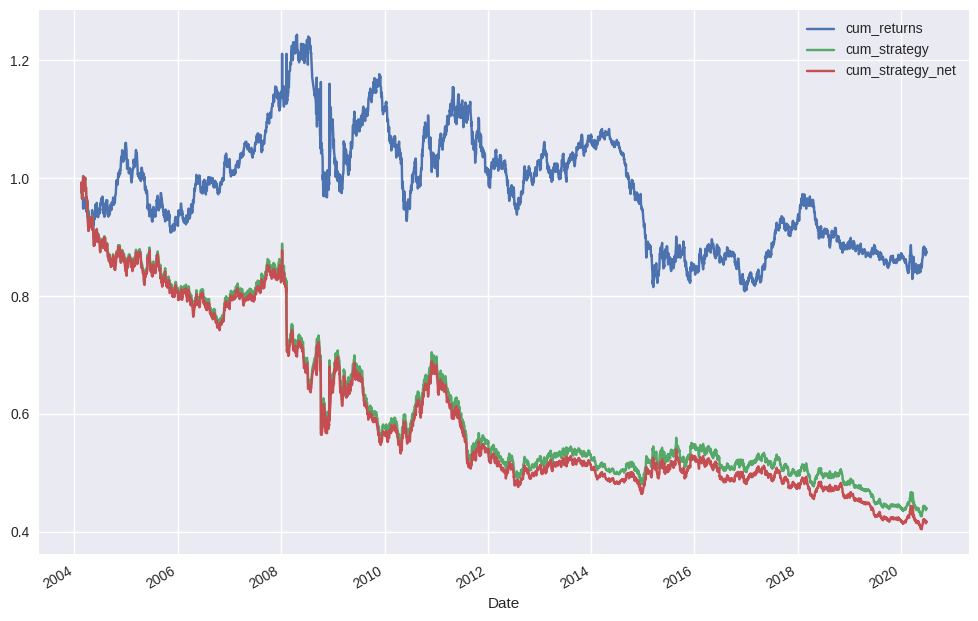

In [157]:
data[["cum_returns", "cum_strategy", "cum_strategy_net"]].plot(figsize=(12, 8))
plt.show()

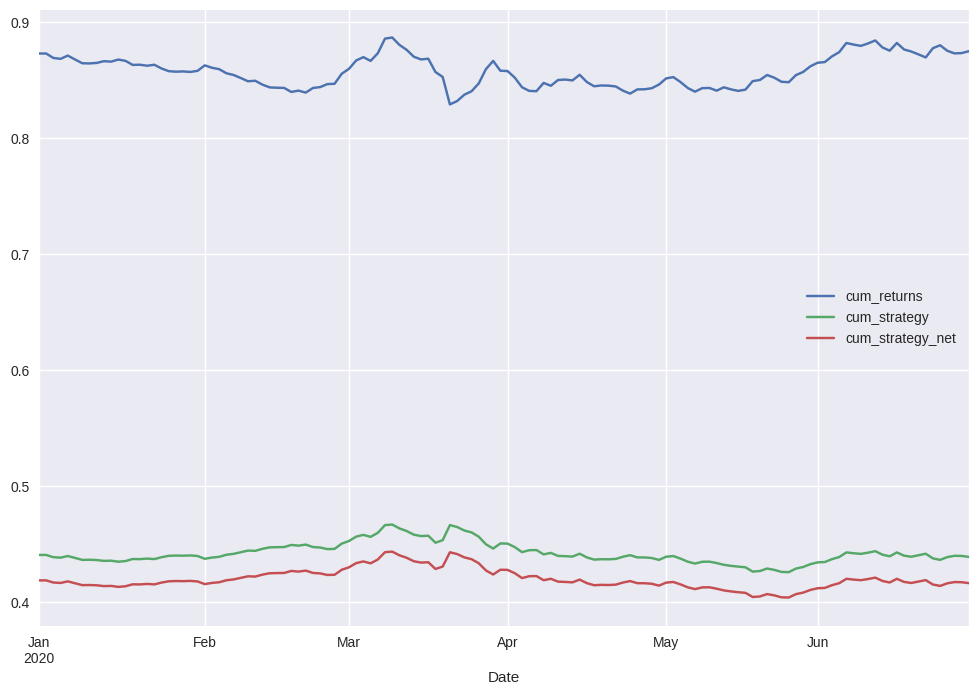

In [158]:
data.loc["2020", ["cum_returns", "cum_strategy", "cum_strategy_net"]].plot(figsize=(12, 8))
plt.show()